In [1]:
!nvidia-smi

Wed Mar  9 08:36:33 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.23.05    Driver Version: 455.23.05    CUDA Version: 11.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:43:00.0 Off |                  N/A |
| 19%   28C    P0    57W / 250W |      0MiB / 11178MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce GTX 108...  Off  | 00000000:44:00.0 Off |                  N/A |
| 18%   

In [63]:
# Choose GPU
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="6"

In [46]:
!python3 -m pip install --upgrade pip
!pip install -r requirements.txt

  Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


In [47]:
!apt-get update
!apt-get install ffmpeg libsm6 libxext6  -y

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Get:2 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease                        
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:6 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Get:7 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]      
Get:10 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]   
Fetched 252 kB in 2s (146 kB/s)    
Reading package lists... Done
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libsm6 is already the newest version (2:1.2.2-1).
libxext6 is already the newest version (2:1.3.3-1).
ffmpeg is already the newest ver

In [48]:
# import libraries
import tensorflow.keras as keras
from imgaug import augmenters as iaa
from imgaug import ia

from tensorflow.keras.layers import AveragePooling2D,GlobalAveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Add
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import GlobalMaxPooling2D
from tensorflow.keras.layers import ZeroPadding2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import MaxPool2D

from tensorflow.keras.models import Model

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import ReduceLROnPlateau

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.initializers import glorot_uniform
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from imutils import paths
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import argparse
import os
import random
import cv2

from PIL import Image


In [49]:
import tensorflow

In [50]:
tensorflow.test.is_gpu_available()

True

In [51]:
INIT_LR = 1e-4
EPOCHS = 20
BS = 16

In [11]:
# grab the list of images in our dataset directory, then initialize
# the list of data (i.e., images) and class images

# from google.colab import drive
# import os
# drive.mount('/content/drive')
# os.chdir("/content/drive/My Drive/Colab Notebooks/")
# !ls

pathname = "dataset"
print("[INFO] loading images...")
imagePaths = list(paths.list_images(pathname))
data = []
labels = []
print("[INFO] finished...")

[INFO] loading images...
[INFO] finished...


In [12]:
# partition the data into training and testing splits using 80% of
# the data for training and the remaining 20% for testing

(trainX, testX) = train_test_split(imagePaths, test_size=0.20, random_state=42)

# Augmentation Improve

In [13]:
x = 346

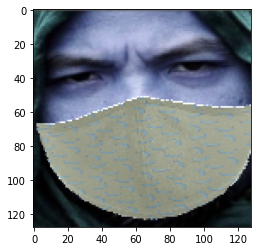

In [14]:
plt.imshow(cv2.imread(trainX[x]))

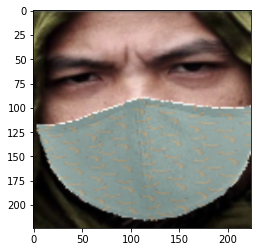

In [15]:
plt.imshow(cv2.resize(np.array(cv2.imread(trainX[x])),(224,224))[:,:,::-1])

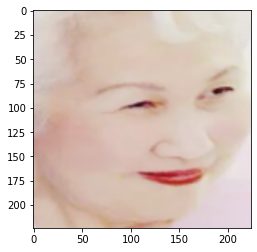

In [16]:
plt.imshow(cv2.resize(cv2.imread(trainX[9]),(224,224))[:,:,::-1])

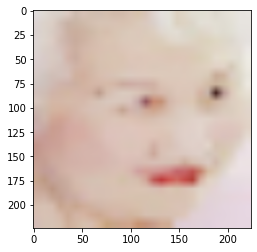

In [17]:
plt.imshow(cv2.resize(cv2.resize(cv2.imread(trainX[9]),(np.random.randint(5,30),np.random.randint(5,30))),(224,224))[:,:,::-1])

In [18]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, imagePaths, batch_size=32, 
                 n_classes=2, shuffle=True):
        'Initialization'
        self.batch_size = batch_size
        self.imagePaths = imagePaths
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.imagePaths) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        imagePaths_temp = [self.imagePaths[k] for k in indexes]
        # Generate data
        X, y = self.__data_generation(imagePaths_temp)

        return X, y

    def on_epoch_end(self): 
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.imagePaths))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)
    
    def __data_generation(self, imagePaths):
      'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
      # loop over the image paths
      data = []
      labels = []
      for imagePath in imagePaths:
        # extract the class label from the filename
        label = imagePath.split(os.path.sep)[-2]
        # load the input image (224x224) and preprocess it
        image = load_img(imagePath, target_size=(224, 224))
        image = img_to_array(image)
        
        if random.random() <= 0.5:
            new_size = np.random.randint(10,40) # make square image
            image = cv2.resize(cv2.resize(image,(new_size, new_size)),(224,224))

        #
        seq = iaa.Sequential([
          iaa.AssertShape((None, 224, 224, 3)), # Check if each image in a batch has shape 224x224x3, otherwise raise an exception:
          iaa.Fliplr(0.3), # horizontal flips

          iaa.Crop(percent=(0, 0.01)), # random crops

          # Small gaussian blur with random sigma between 0 and 0.5.
          # But we only blur about 50% of all images.
          iaa.Sometimes(
              0.6,
              iaa.GaussianBlur(sigma=(0, 0.3))
          ),
          
          iaa.Sometimes(
              0.4,
              iaa.PiecewiseAffine(scale=(0.01, 0.05))
          ),
          
          # Strengthen or weaken the contrast in each image.
          iaa.LinearContrast((1.0, 1.5)),

          # Add gaussian noise.
          # For 50% of all images, we sample the noise once per pixel.
          # For the other 50% of all images, we sample the noise per pixel AND
          # channel. This can change the color (not only brightness) of the
          # pixels.
          iaa.AdditiveGaussianNoise(loc=0, scale=(10, 0.07*255), per_channel=0.5),

          # Make some images brighter and some darker.
          # In 20% of all cases, we sample the multiplier once per channel,
          # which can end up changing the color of the images.
          iaa.Multiply((1.2, 1.5), per_channel=0.2), # change brightness, doesn't affect keypoints

          # Apply affine transformations to each image.
          # Scale/zoom them, translate/move them, rotate them and shear them.
          iaa.Affine(
              scale={"x": (1.0, 1.2), "y": (1.0, 1.2)},
              translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)},
              rotate=(-15, 35),
              shear=(-2, 6)
          ),
          iaa.WithChannels(1, iaa.Add((10, 45))),
          iaa.Noop(),
          iaa.ChannelShuffle(0.35, channels=[0, 1]),
          ], random_order=True,
          )
        #

        images_aug = seq(image=image)

        image = preprocess_input(images_aug)
        
        # update the data and labels lists, respectively
        data.append(image)

        # multiple labels
        if label == 'with_mask':
          labels.append(0)
        elif label == 'without_mask':
          labels.append(1)
        
      # convert the data and labels to NumPy arrays
      data = np.array(data, dtype="float32")
      labels = np.array(labels)
      
      return data, keras.utils.to_categorical(labels, num_classes=self.n_classes)

In [19]:
training_generator = DataGenerator(imagePaths=trainX, batch_size=BS, n_classes=2, shuffle=True)
validation_generator = DataGenerator(imagePaths=testX, batch_size=BS, n_classes=2, shuffle=True)

In [20]:
# aug = ImageDataGenerator(
# 	rotation_range=20,
# 	zoom_range=0.15,
# 	width_shift_range=0.2,
# 	height_shift_range=0.2,
# 	shear_range=0.15,
# 	horizontal_flip=True,
# 	fill_mode="nearest")

# 1. RESNET 50

In [23]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

In [24]:
# the ResNet50 network

baseModel = ResNet50(weights="imagenet", include_top=False, 
	input_tensor=Input(shape=(224, 224, 3)))

headModel = baseModel.output
headModel = GlobalAveragePooling2D()(headModel)
# headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

resnet_50_model = Model(inputs=baseModel.input, outputs=headModel)

## 1.1 Warm up

In [25]:
# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
	layer.trainable = False

# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
resnet_50_model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [26]:
resnet_50_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [27]:
# train the head of the network
print("[INFO] training head...")

resnet_50_H = resnet_50_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=5, 
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/5
2811/3098 [==========================>...] - ETA: 16s - loss: 0.4631 - accuracy: 0.7799

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.4574 - accuracy: 0.7835WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 222s 72ms/step - loss: 0.4574 - accuracy: 0.7835 - val_loss: 0.3841 - val_accuracy: 0.8248
Epoch 2/5
1542/3098 [=============>................] - ETA: 1:26 - loss: 0.3768 - accuracy: 0.8304

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.3707 - accuracy: 0.8329WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 221s 71ms/step - loss: 0.3707 - accuracy: 0.8329 - val_loss: 0.3273 - val_accuracy: 0.8563
Epoch 3/5
 546/3098 [====>.........................] - ETA: 2:19 - loss: 0.3576 - accuracy: 0.8410

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.3463 - accuracy: 0.8474WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 220s 71ms/step - loss: 0.3463 - accuracy: 0.8474 - val_loss: 0.3192 - val_accuracy: 0.8661
Epoch 4/5
 115/3098 [>.............................] - ETA: 3:01 - loss: 0.3187 - accuracy: 0.8609

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.3303 - accuracy: 0.8565WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 221s 71ms/step - loss: 0.3303 - accuracy: 0.8565 - val_loss: 0.3020 - val_accuracy: 0.8711
Epoch 5/5
 754/3098 [======>.......................] - ETA: 2:07 - loss: 0.3200 - accuracy: 0.8563

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.3169 - accuracy: 0.8618WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 220s 71ms/step - loss: 0.3169 - accuracy: 0.8618 - val_loss: 0.2838 - val_accuracy: 0.8788
[INFO] finished...


##  1.2 Train ALL

In [28]:
for layer in baseModel.layers:
	layer.trainable = True

In [29]:
# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
resnet_50_model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [30]:
resnet_50_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 112, 112, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

In [31]:
# train the head of the network
print("[INFO] training head...")

resnet_50_H = resnet_50_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=EPOCHS, 
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Epoch 1/20
1681/3098 [===============>..............] - ETA: 2:35 - loss: 0.2135 - accuracy: 0.9213

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1910 - accuracy: 0.9304WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.1910 - accuracy: 0.9304 - val_loss: 0.1393 - val_accuracy: 0.9499
Epoch 2/20
 544/3098 [====>.........................] - ETA: 4:39 - loss: 0.1485 - accuracy: 0.9468

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1474 - accuracy: 0.9479WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 385s 124ms/step - loss: 0.1474 - accuracy: 0.9479 - val_loss: 0.1678 - val_accuracy: 0.9419
Epoch 3/20
1347/3098 [============>.................] - ETA: 3:11 - loss: 0.1364 - accuracy: 0.9517

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1335 - accuracy: 0.9532WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 385s 124ms/step - loss: 0.1335 - accuracy: 0.9532 - val_loss: 0.1237 - val_accuracy: 0.9562
Epoch 4/20
 133/3098 [>.............................] - ETA: 5:23 - loss: 0.1174 - accuracy: 0.9596

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1265 - accuracy: 0.9552WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 385s 124ms/step - loss: 0.1265 - accuracy: 0.9552 - val_loss: 0.1519 - val_accuracy: 0.9492
Epoch 5/20
2183/3098 [====================>.........] - ETA: 1:40 - loss: 0.1206 - accuracy: 0.9567

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1218 - accuracy: 0.9566WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.1218 - accuracy: 0.9566 - val_loss: 0.1224 - val_accuracy: 0.9569
Epoch 6/20
2879/3098 [==========================>...] - ETA: 24s - loss: 0.1163 - accuracy: 0.9592

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1173 - accuracy: 0.9589WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 385s 124ms/step - loss: 0.1173 - accuracy: 0.9589 - val_loss: 0.1204 - val_accuracy: 0.9562
Epoch 7/20
  83/3098 [..............................] - ETA: 5:31 - loss: 0.1020 - accuracy: 0.9654

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1132 - accuracy: 0.9606WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.1132 - accuracy: 0.9606 - val_loss: 0.1382 - val_accuracy: 0.9489
Epoch 8/20
1864/3098 [=================>............] - ETA: 2:15 - loss: 0.1078 - accuracy: 0.9617

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1113 - accuracy: 0.9606WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00008: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
3098/3098 [==============================] - 385s 124ms/step - loss: 0.1113 - accuracy: 0.9606 - val_loss: 0.1228 - val_accuracy: 0.9568
Epoch 9/20
2337/3098 [=====================>........] - ETA: 1:23 - loss: 0.0963 - accuracy: 0.9661

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0960 - accuracy: 0.9658WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 385s 124ms/step - loss: 0.0960 - accuracy: 0.9658 - val_loss: 0.1090 - val_accuracy: 0.9627
Epoch 10/20
1961/3098 [=================>............] - ETA: 2:05 - loss: 0.0893 - accuracy: 0.9686

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0914 - accuracy: 0.9681WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.0914 - accuracy: 0.9681 - val_loss: 0.1028 - val_accuracy: 0.9639
Epoch 11/20
1301/3098 [===========>..................] - ETA: 3:17 - loss: 0.0883 - accuracy: 0.9687

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0896 - accuracy: 0.9684WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 124ms/step - loss: 0.0896 - accuracy: 0.9684 - val_loss: 0.1018 - val_accuracy: 0.9652
Epoch 12/20
1993/3098 [==================>...........] - ETA: 2:01 - loss: 0.0849 - accuracy: 0.9701

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0870 - accuracy: 0.9695WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.0870 - accuracy: 0.9695 - val_loss: 0.1022 - val_accuracy: 0.9656
Epoch 13/20
  69/3098 [..............................] - ETA: 5:32 - loss: 0.0964 - accuracy: 0.9656

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0841 - accuracy: 0.9711WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.0841 - accuracy: 0.9711 - val_loss: 0.1005 - val_accuracy: 0.9653
Epoch 14/20
 749/3098 [======>.......................] - ETA: 4:18 - loss: 0.0778 - accuracy: 0.9730

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0810 - accuracy: 0.9721WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.0810 - accuracy: 0.9721 - val_loss: 0.0989 - val_accuracy: 0.9658
Epoch 15/20
 630/3098 [=====>........................] - ETA: 4:32 - loss: 0.0704 - accuracy: 0.9756

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0803 - accuracy: 0.9712WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.0803 - accuracy: 0.9712 - val_loss: 0.1019 - val_accuracy: 0.9650
Epoch 16/20
2432/3098 [======================>.......] - ETA: 1:13 - loss: 0.0758 - accuracy: 0.9731

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0773 - accuracy: 0.9725WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00016: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
3098/3098 [==============================] - 387s 125ms/step - loss: 0.0773 - accuracy: 0.9725 - val_loss: 0.1027 - val_accuracy: 0.9654
Epoch 17/20
1490/3098 [=============>................] - ETA: 2:57 - loss: 0.0753 - accuracy: 0.9736

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0716 - accuracy: 0.9749WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 386s 125ms/step - loss: 0.0716 - accuracy: 0.9749 - val_loss: 0.0984 - val_accuracy: 0.9675
Epoch 18/20
1596/3098 [==============>...............] - ETA: 2:45 - loss: 0.0652 - accuracy: 0.9775

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0679 - accuracy: 0.9763WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.0679 - accuracy: 0.9763 - val_loss: 0.0989 - val_accuracy: 0.9675
Epoch 19/20
1664/3098 [===============>..............] - ETA: 2:38 - loss: 0.0641 - accuracy: 0.9775

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0653 - accuracy: 0.9770WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.0653 - accuracy: 0.9770 - val_loss: 0.0971 - val_accuracy: 0.9675
Epoch 20/20
1445/3098 [============>.................] - ETA: 3:02 - loss: 0.0662 - accuracy: 0.9769

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0646 - accuracy: 0.9774WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 387s 125ms/step - loss: 0.0646 - accuracy: 0.9774 - val_loss: 0.1019 - val_accuracy: 0.9668
[INFO] finished...


## 1.3 Visualize

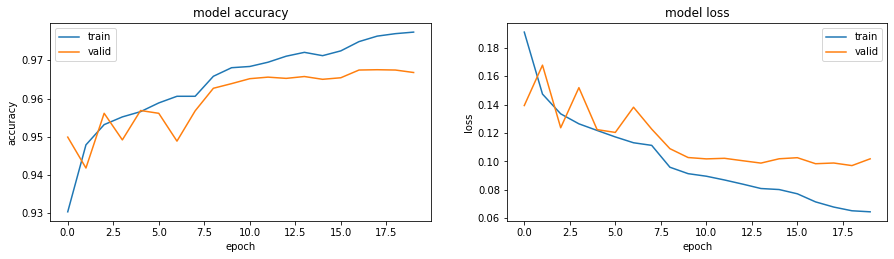

In [32]:
plt.figure(1, figsize = (15,8)) 
    
plt.subplot(221)  
plt.plot(resnet_50_H.history['accuracy'])  
plt.plot(resnet_50_H.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 
    
plt.subplot(222)  
plt.plot(resnet_50_H.history['loss'])  
plt.plot(resnet_50_H.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 

plt.show()

## 1.4  Save model

In [33]:
# serialize the model to disk
print("[INFO] saving mask detector model...")
resnet_50_model.save("output_model/mask_detector_resnet_50", save_format="h5")
print("[INFO] saved model...")


[INFO] saving mask detector model...
[INFO] saved model...


# 2. RESNET-34

In [34]:
from tensorflow import keras 
from classification_models.tfkeras  import Classifiers

# for tensorflow.keras
# from classification_models.tfkeras import Classifiers
ResNet34, preprocess_input = Classifiers.get('resnet34')

In [35]:
# # the ResNet34 network

baseModel = ResNet34(weights="imagenet", include_top=False, 
	input_tensor=Input(shape=(224, 224, 3)))

headModel = baseModel.output
headModel = GlobalAveragePooling2D()(headModel)
# headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
# headModel = Flatten(name="flatten")(headModel)
headModel = Dense(256, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

resnet_34_model = Model(inputs=baseModel.input, outputs=headModel)

85524480/85521592 [==============================] - 13s 0us/step


## 2.1 Warm up

In [36]:
# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
	layer.trainable = False

# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
resnet_34_model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [37]:
resnet_34_model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 224, 224, 3)  9           input_2[0][0]                    
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
_______________________________________________________________________________________

stage4_unit2_bn1 (BatchNormaliz (None, 7, 7, 512)    2048        add_13[0][0]                     
__________________________________________________________________________________________________
stage4_unit2_relu1 (Activation) (None, 7, 7, 512)    0           stage4_unit2_bn1[0][0]           
__________________________________________________________________________________________________
zero_padding2d_30 (ZeroPadding2 (None, 9, 9, 512)    0           stage4_unit2_relu1[0][0]         
__________________________________________________________________________________________________
stage4_unit2_conv1 (Conv2D)     (None, 7, 7, 512)    2359296     zero_padding2d_30[0][0]          
__________________________________________________________________________________________________
stage4_unit2_bn2 (BatchNormaliz (None, 7, 7, 512)    2048        stage4_unit2_conv1[0][0]         
__________________________________________________________________________________________________
stage4_uni

In [38]:
# train the head of the network
print("[INFO] training head...")

resnet_34_H = resnet_34_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=5, 
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Epoch 1/5
2060/3098 [==================>...........] - ETA: 55s - loss: 0.6291 - accuracy: 0.6617

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.6046 - accuracy: 0.6777WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 211s 68ms/step - loss: 0.6046 - accuracy: 0.6777 - val_loss: 0.5171 - val_accuracy: 0.7434
Epoch 2/5
1927/3098 [=================>............] - ETA: 1:02 - loss: 0.5287 - accuracy: 0.7281

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.5271 - accuracy: 0.7290WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 211s 68ms/step - loss: 0.5271 - accuracy: 0.7291 - val_loss: 0.4939 - val_accuracy: 0.7552
Epoch 3/5
 692/3098 [=====>........................] - ETA: 2:06 - loss: 0.5072 - accuracy: 0.7491

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.5037 - accuracy: 0.7482WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 212s 69ms/step - loss: 0.5037 - accuracy: 0.7482 - val_loss: 0.4689 - val_accuracy: 0.7776
Epoch 4/5
 349/3098 [==>...........................] - ETA: 2:26 - loss: 0.4964 - accuracy: 0.7547

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.4926 - accuracy: 0.7585WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 214s 69ms/step - loss: 0.4926 - accuracy: 0.7585 - val_loss: 0.4608 - val_accuracy: 0.7811
Epoch 5/5
1075/3098 [=========>....................] - ETA: 1:44 - loss: 0.4841 - accuracy: 0.7656

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.4794 - accuracy: 0.7677WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 211s 68ms/step - loss: 0.4794 - accuracy: 0.7677 - val_loss: 0.4462 - val_accuracy: 0.7867
[INFO] finished...


Process Keras_worker_ForkPoolWorker-1332:
Process Keras_worker_ForkPoolWorker-1339:
Process Keras_worker_ForkPoolWorker-1338:
Process Keras_worker_ForkPoolWorker-1337:
Process Keras_worker_ForkPoolWorker-1336:
Process Keras_worker_ForkPoolWorker-1335:
Traceback (most recent call last):
Process Keras_worker_ForkPoolWorker-1334:
Process Keras_worker_ForkPoolWorker-1342:
Traceback (most recent call last):
Process Keras_worker_ForkPoolWorker-1344:
Traceback (most recent call last):
Process Keras_worker_ForkPoolWorker-1340:
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
Process Keras_worker_ForkPoolWorker-1333:
  File "/usr/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Process 

  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 379, in _recv
    chunk = read(handle, remaining)
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
KeyboardInterrupt
  File "/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/utils/data_utils.py", line 679, in get_index
    return _SHARED_SEQUENCES[uid][i]
  File "/usr/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/usr/lib/python3.6/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
KeyboardInterrupt
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
  File "/usr/lib/python3.6/multiprocessing/pool.py", line 108, in worker
    task = get()
KeyboardInterrupt
  File "/usr/lib/python3.6/multiproc

## 2.2 Train ALL

In [39]:
for layer in baseModel.layers:
	layer.trainable = True

In [40]:
# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
resnet_34_model.compile(loss="categorical_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [41]:
resnet_34_model.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
bn_data (BatchNormalization)    (None, 224, 224, 3)  9           input_2[0][0]                    
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           bn_data[0][0]                    
__________________________________________________________________________________________________
conv0 (Conv2D)                  (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
_______________________________________________________________________________________

In [42]:
# train the head of the network
print("[INFO] training head...")

resnet_34_H = resnet_34_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=EPOCHS, 
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Epoch 1/20
 696/3098 [=====>........................] - ETA: 2:53 - loss: 0.3118 - accuracy: 0.8739

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.2118 - accuracy: 0.9212WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 270s 87ms/step - loss: 0.2118 - accuracy: 0.9212 - val_loss: 0.1482 - val_accuracy: 0.9452
Epoch 2/20
  24/3098 [..............................] - ETA: 3:45 - loss: 0.1935 - accuracy: 0.9297

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1509 - accuracy: 0.9474WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1509 - accuracy: 0.9474 - val_loss: 0.1299 - val_accuracy: 0.9557
Epoch 3/20
 237/3098 [=>............................] - ETA: 3:25 - loss: 0.1324 - accuracy: 0.9533

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1358 - accuracy: 0.9528WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 268s 87ms/step - loss: 0.1358 - accuracy: 0.9528 - val_loss: 0.1203 - val_accuracy: 0.9562
Epoch 4/20
 758/3098 [======>.......................] - ETA: 2:49 - loss: 0.1257 - accuracy: 0.9551

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1285 - accuracy: 0.9546WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1285 - accuracy: 0.9546 - val_loss: 0.1319 - val_accuracy: 0.9545
Epoch 5/20
2574/3098 [=======================>......] - ETA: 38s - loss: 0.1241 - accuracy: 0.9563

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1225 - accuracy: 0.9568WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1225 - accuracy: 0.9568 - val_loss: 0.1169 - val_accuracy: 0.9589
Epoch 6/20
 451/3098 [===>..........................] - ETA: 3:11 - loss: 0.1127 - accuracy: 0.9600

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1180 - accuracy: 0.9584WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 270s 87ms/step - loss: 0.1180 - accuracy: 0.9584 - val_loss: 0.1173 - val_accuracy: 0.9610
Epoch 7/20
2544/3098 [=======================>......] - ETA: 40s - loss: 0.1122 - accuracy: 0.9611

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1126 - accuracy: 0.9612WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1126 - accuracy: 0.9612 - val_loss: 0.1138 - val_accuracy: 0.9602
Epoch 8/20
1445/3098 [============>.................] - ETA: 1:59 - loss: 0.1073 - accuracy: 0.9629

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1095 - accuracy: 0.9617WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 268s 86ms/step - loss: 0.1095 - accuracy: 0.9617 - val_loss: 0.1117 - val_accuracy: 0.9615
Epoch 9/20
2820/3098 [==========================>...] - ETA: 20s - loss: 0.1069 - accuracy: 0.9635

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1054 - accuracy: 0.9641WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 268s 87ms/step - loss: 0.1054 - accuracy: 0.9641 - val_loss: 0.1103 - val_accuracy: 0.9626
Epoch 10/20
2813/3098 [==========================>...] - ETA: 20s - loss: 0.1036 - accuracy: 0.9641

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1039 - accuracy: 0.9638WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1039 - accuracy: 0.9638 - val_loss: 0.1089 - val_accuracy: 0.9625
Epoch 11/20
 157/3098 [>.............................] - ETA: 3:31 - loss: 0.1041 - accuracy: 0.9670

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1013 - accuracy: 0.9643WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.1013 - accuracy: 0.9643 - val_loss: 0.1016 - val_accuracy: 0.9633
Epoch 12/20
2477/3098 [======================>.......] - ETA: 44s - loss: 0.0985 - accuracy: 0.9655

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0985 - accuracy: 0.9655WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.0985 - accuracy: 0.9655 - val_loss: 0.1073 - val_accuracy: 0.9625
Epoch 13/20
1692/3098 [===============>..............] - ETA: 1:41 - loss: 0.0958 - accuracy: 0.9669

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0959 - accuracy: 0.9663WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00013: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
3098/3098 [==============================] - 269s 87ms/step - loss: 0.0959 - accuracy: 0.9663 - val_loss: 0.1108 - val_accuracy: 0.9602
Epoch 14/20
 567/3098 [====>.........................] - ETA: 3:01 - loss: 0.0880 - accuracy: 0.9710

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0836 - accuracy: 0.9708WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.0836 - accuracy: 0.9708 - val_loss: 0.1003 - val_accuracy: 0.9658
Epoch 15/20
 617/3098 [====>.........................] - ETA: 2:58 - loss: 0.0728 - accuracy: 0.9743

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0794 - accuracy: 0.9728WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 269s 87ms/step - loss: 0.0794 - accuracy: 0.9728 - val_loss: 0.0955 - val_accuracy: 0.9671
Epoch 16/20
1985/3098 [==================>...........] - ETA: 1:20 - loss: 0.0780 - accuracy: 0.9735

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0789 - accuracy: 0.9730WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 267s 86ms/step - loss: 0.0789 - accuracy: 0.9730 - val_loss: 0.1013 - val_accuracy: 0.9632
Epoch 17/20
  44/3098 [..............................] - ETA: 3:40 - loss: 0.0607 - accuracy: 0.9773

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0739 - accuracy: 0.9743WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00017: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
3098/3098 [==============================] - 268s 87ms/step - loss: 0.0739 - accuracy: 0.9743 - val_loss: 0.0994 - val_accuracy: 0.9676
Epoch 18/20
2736/3098 [=========================>....] - ETA: 26s - loss: 0.0693 - accuracy: 0.9762

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0691 - accuracy: 0.9762WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 268s 86ms/step - loss: 0.0691 - accuracy: 0.9762 - val_loss: 0.0961 - val_accuracy: 0.9663
Epoch 19/20
2671/3098 [========================>.....] - ETA: 30s - loss: 0.0660 - accuracy: 0.9769

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0658 - accuracy: 0.9770WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00019: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
3098/3098 [==============================] - 267s 86ms/step - loss: 0.0658 - accuracy: 0.9770 - val_loss: 0.0960 - val_accuracy: 0.9683
Epoch 20/20
 433/3098 [===>..........................] - ETA: 3:10 - loss: 0.0697 - accuracy: 0.9765

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0625 - accuracy: 0.9780WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 267s 86ms/step - loss: 0.0625 - accuracy: 0.9780 - val_loss: 0.1050 - val_accuracy: 0.9680
[INFO] finished...


In [43]:
# serialize the model to disk
print("[INFO] saving mask detector model...")
resnet_34_model.save("output_model/mask_detector_resnet_34", save_format="h5")
print("[INFO] saved model...")

[INFO] saving mask detector model...
[INFO] saved model...


## 2.3 Visualize

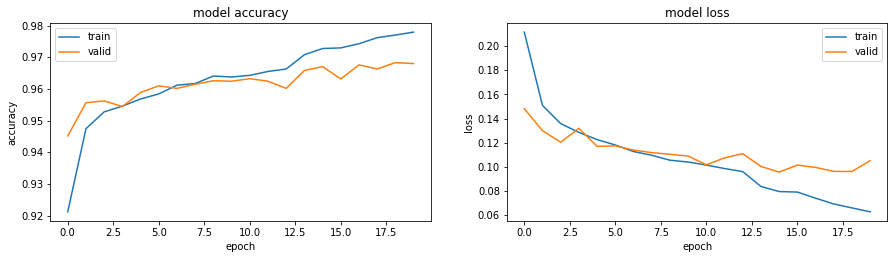

In [44]:
plt.figure(1, figsize = (15,8)) 
    
plt.subplot(221)  
plt.plot(resnet_34_H.history['accuracy'])  
plt.plot(resnet_34_H.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 
    
plt.subplot(222)  
plt.plot(resnet_34_H.history['loss'])  
plt.plot(resnet_34_H.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 

plt.show()

# 3. MOBILENET V2

In [21]:
# the MobileNetV2 network
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

baseModel = MobileNetV2(weights="imagenet", include_top=False,
	input_tensor=Input(shape=(224, 224, 3)))

headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(7, 7))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)

mobilenet_v2_model = Model(inputs=baseModel.input, outputs=headModel)

## 3.1 Warn up

In [22]:
# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
	layer.trainable = False

# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
mobilenet_v2_model.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [23]:
mobilenet_v2_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________________

In [24]:
# train the head of the network
print("[INFO] training head...")

mobilenet_v2_H = mobilenet_v2_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=5,
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/5
2077/3098 [===================>..........] - ETA: 54s - loss: 0.5406 - accuracy: 0.7183

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.5140 - accuracy: 0.7375WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 210s 68ms/step - loss: 0.5140 - accuracy: 0.7375 - val_loss: 0.4211 - val_accuracy: 0.8004
Epoch 2/5
2629/3098 [========================>.....] - ETA: 24s - loss: 0.4293 - accuracy: 0.7970

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.4266 - accuracy: 0.7982WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 208s 67ms/step - loss: 0.4266 - accuracy: 0.7982 - val_loss: 0.3866 - val_accuracy: 0.8250
Epoch 3/5
 874/3098 [=======>......................] - ETA: 1:57 - loss: 0.4093 - accuracy: 0.8084

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.4046 - accuracy: 0.8112WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 209s 67ms/step - loss: 0.4046 - accuracy: 0.8112 - val_loss: 0.3672 - val_accuracy: 0.8357
Epoch 4/5
2107/3098 [===================>..........] - ETA: 51s - loss: 0.3925 - accuracy: 0.8143

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.3901 - accuracy: 0.8159WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 207s 67ms/step - loss: 0.3900 - accuracy: 0.8159 - val_loss: 0.3473 - val_accuracy: 0.8445
Epoch 5/5
 807/3098 [======>.......................] - ETA: 2:01 - loss: 0.3809 - accuracy: 0.8199

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3097/3098 [============================>.] - ETA: 0s - loss: 0.3800 - accuracy: 0.8251WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 209s 68ms/step - loss: 0.3799 - accuracy: 0.8251 - val_loss: 0.3481 - val_accuracy: 0.8456
[INFO] finished...


## 3.2 Train all

In [25]:
# loop over all layers in the base model and freeze them so they will
# *not* be updated during the first training process
for layer in baseModel.layers:
	layer.trainable = True

# compile our model
print("[INFO] compiling model...")
opt = Adam(lr=INIT_LR, decay=INIT_LR / EPOCHS)
es=EarlyStopping(monitor='val_accuracy', mode='max', verbose=1, patience=20)
patient = 4
rlr=ReduceLROnPlateau(
        monitor = 'val_loss', 
        factor = 0.5, 
        patience = patient / 2, 
        min_lr=1e-6,
        verbose=1,
        mode='min'
    )
mobilenet_v2_model.compile(loss="binary_crossentropy", optimizer=opt,
	metrics=["accuracy"])
print("[INFO] finished...")

[INFO] compiling model...
[INFO] finished...


In [26]:
mobilenet_v2_model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
_______________________________________________________________________________________

In [ ]:
# train the head of the network
print("[INFO] training head...")

mobilenet_v2_H = mobilenet_v2_model.fit_generator(generator=training_generator,
                    validation_data=validation_generator,
										use_multiprocessing=True,
										epochs=EPOCHS,
										workers=16,
										callbacks=[es,rlr])
print("[INFO] finished...")

[INFO] training head...
Epoch 1/20
 479/3098 [===>..........................] - ETA: 3:16 - loss: 0.4120 - accuracy: 0.8108

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.2487 - accuracy: 0.9005WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 278s 90ms/step - loss: 0.2487 - accuracy: 0.9005 - val_loss: 0.2292 - val_accuracy: 0.9025
Epoch 2/20
 903/3098 [=======>......................] - ETA: 2:48 - loss: 0.1728 - accuracy: 0.9396

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1657 - accuracy: 0.9421WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 280s 90ms/step - loss: 0.1657 - accuracy: 0.9421 - val_loss: 0.1482 - val_accuracy: 0.9482
Epoch 3/20
1881/3098 [=================>............] - ETA: 1:32 - loss: 0.1484 - accuracy: 0.9477

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1470 - accuracy: 0.9488WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 279s 90ms/step - loss: 0.1470 - accuracy: 0.9488 - val_loss: 0.1384 - val_accuracy: 0.9547
Epoch 4/20
  60/3098 [..............................] - ETA: 3:52 - loss: 0.1526 - accuracy: 0.9500

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1359 - accuracy: 0.9525WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 280s 90ms/step - loss: 0.1359 - accuracy: 0.9525 - val_loss: 0.1284 - val_accuracy: 0.9530
Epoch 5/20
1487/3098 [=============>................] - ETA: 2:04 - loss: 0.1305 - accuracy: 0.9553

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1268 - accuracy: 0.9563WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 283s 91ms/step - loss: 0.1268 - accuracy: 0.9563 - val_loss: 0.1286 - val_accuracy: 0.9558
Epoch 6/20
2862/3098 [==========================>...] - ETA: 17s - loss: 0.1204 - accuracy: 0.9589

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1213 - accuracy: 0.9584WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 279s 90ms/step - loss: 0.1213 - accuracy: 0.9584 - val_loss: 0.1226 - val_accuracy: 0.9571
Epoch 7/20
2668/3098 [========================>.....] - ETA: 33s - loss: 0.1174 - accuracy: 0.9600

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1176 - accuracy: 0.9600WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 284s 92ms/step - loss: 0.1176 - accuracy: 0.9600 - val_loss: 0.1214 - val_accuracy: 0.9561
Epoch 8/20
2195/3098 [====================>.........] - ETA: 1:08 - loss: 0.1119 - accuracy: 0.9616

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1124 - accuracy: 0.9611WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 280s 90ms/step - loss: 0.1124 - accuracy: 0.9611 - val_loss: 0.1265 - val_accuracy: 0.9564
Epoch 9/20
2459/3098 [======================>.......] - ETA: 48s - loss: 0.1092 - accuracy: 0.9624

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1116 - accuracy: 0.9617WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 277s 89ms/step - loss: 0.1116 - accuracy: 0.9617 - val_loss: 0.1142 - val_accuracy: 0.9587
Epoch 10/20
3098/3098 [==============================] - ETA: 0s - loss: 0.1073 - accuracy: 0.9625WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 278s 90ms/step - loss: 0.1073 - accuracy: 0.9625 - val_loss: 0.1166 - val_accuracy: 0.9605
Epoch 11/20
 143/3098 [>.............................] - ETA: 3:42 - loss: 0.1069 - accuracy: 0.9611

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.1066 - accuracy: 0.9630WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00011: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
3098/3098 [==============================] - 279s 90ms/step - loss: 0.1066 - accuracy: 0.9630 - val_loss: 0.1215 - val_accuracy: 0.9604
Epoch 12/20
2429/3098 [======================>.......] - ETA: 50s - loss: 0.0925 - accuracy: 0.9673

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0947 - accuracy: 0.9667WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 279s 90ms/step - loss: 0.0947 - accuracy: 0.9667 - val_loss: 0.1055 - val_accuracy: 0.9646
Epoch 13/20
 340/3098 [==>...........................] - ETA: 3:31 - loss: 0.0935 - accuracy: 0.9673

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0893 - accuracy: 0.9685WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 280s 90ms/step - loss: 0.0893 - accuracy: 0.9685 - val_loss: 0.1029 - val_accuracy: 0.9655
Epoch 14/20
1427/3098 [============>.................] - ETA: 2:09 - loss: 0.0836 - accuracy: 0.9713

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0867 - accuracy: 0.9698WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 283s 91ms/step - loss: 0.0867 - accuracy: 0.9698 - val_loss: 0.1078 - val_accuracy: 0.9635
Epoch 15/20
  51/3098 [..............................] - ETA: 3:53 - loss: 0.0951 - accuracy: 0.9645

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0861 - accuracy: 0.9691WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00015: ReduceLROnPlateau reducing learning rate to 2.499999936844688e-05.
3098/3098 [==============================] - 281s 91ms/step - loss: 0.0861 - accuracy: 0.9691 - val_loss: 0.1068 - val_accuracy: 0.9632
Epoch 16/20
2219/3098 [====================>.........] - ETA: 1:07 - loss: 0.0791 - accuracy: 0.9717

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0793 - accuracy: 0.9714WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 282s 91ms/step - loss: 0.0793 - accuracy: 0.9714 - val_loss: 0.0998 - val_accuracy: 0.9673
Epoch 17/20
 960/3098 [========>.....................] - ETA: 2:43 - loss: 0.0793 - accuracy: 0.9714

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - 280s 90ms/step - loss: 0.0749 - accuracy: 0.9738 - val_loss: 0.1069 - val_accuracy: 0.9650
Epoch 18/20
 100/3098 [..............................] - ETA: 3:53 - loss: 0.0703 - accuracy: 0.9775

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


3098/3098 [==============================] - ETA: 0s - loss: 0.0769 - accuracy: 0.9732WARNING:tensorflow:multiprocessing can interact badly with TensorFlow, causing nondeterministic deadlocks. For high performance data pipelines tf.data is recommended.


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:976: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "



Epoch 00018: ReduceLROnPlateau reducing learning rate to 1.249999968422344e-05.
3098/3098 [==============================] - 281s 91ms/step - loss: 0.0769 - accuracy: 0.9732 - val_loss: 0.1039 - val_accuracy: 0.9652
Epoch 19/20
1278/3098 [===========>..................] - ETA: 2:18 - loss: 0.0707 - accuracy: 0.9742

## 3.3 Save model

In [ ]:
# serialize the model to disk
print("[INFO] saving mask detector model...")
mobilenet_v2_model.save("output_model/mask_detector_mobilenet_v2", save_format="h5")
print("[INFO] saved model...")

## 3.4 Visualize


In [ ]:
plt.figure(1, figsize = (15,8)) 
    
plt.subplot(221)  
plt.plot(mobilenet_v2_H.history['accuracy'])  
plt.plot(mobilenet_v2_H.history['val_accuracy'])  
plt.title('model accuracy')  
plt.ylabel('accuracy')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 
    
plt.subplot(222)  
plt.plot(mobilenet_v2_H.history['loss'])  
plt.plot(mobilenet_v2_H.history['val_loss'])  
plt.title('model loss')  
plt.ylabel('loss')  
plt.xlabel('epoch')  
plt.legend(['train', 'valid']) 

plt.show()

# 3 .TEST

## 3.1 Resnet 50 

In [64]:
!python detect_mask_image.py --model output_model/mask_detector_resnet_50 --image testset

2022-03-09 05:54:23.520892: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
[INFO] loading face detector model...
[INFO] loading face mask detector model...
2022-03-09 05:54:25.581696: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-03-09 05:54:26.455891: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:8c:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2022-03-09 05:54:26.455928: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-03-09 05:54:26.457116: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-03-09 05:54:26.458301: I tensorflow/stream_executor

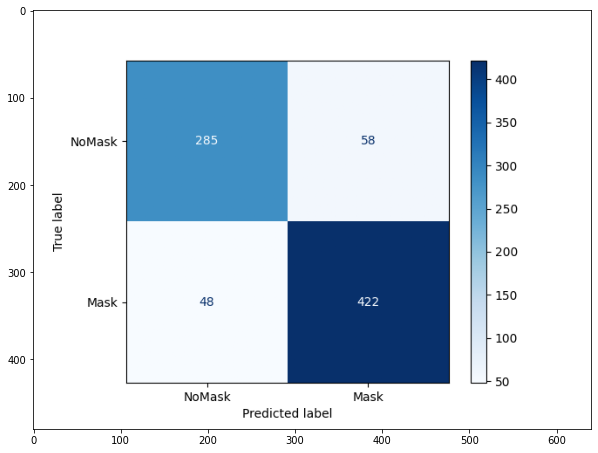

In [65]:
img = mpimg.imread('output_confusionMatrix_png/resnet_50.png')
plt.figure(figsize=(10,10)) 
imgplot = plt.imshow(img)
plt.show()

testset/NoMask/38_SK8z_sdc-4_2022-02-08-11.40.03_0_yoloface.jpg


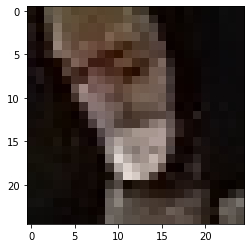

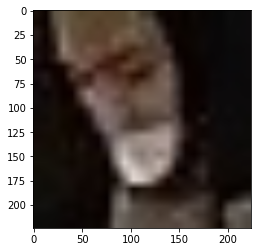

testset/NoMask/38_0Cu3_dfb_2022-02-21-15.38.38_2_yoloface.jpg


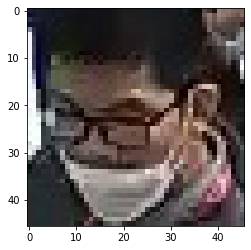

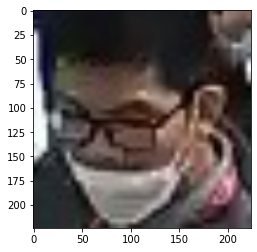

testset/NoMask/frame_2021_12_15_11_16_05_0.jpg


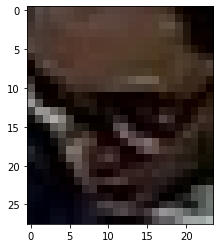

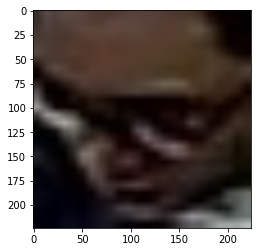

testset/NoMask/38_0Cu3_dfb_2022-02-22-09.38.33_1_yoloface.jpg


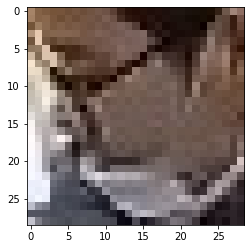

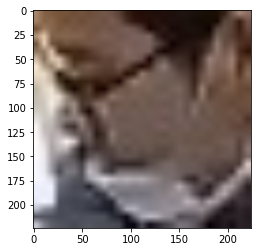

testset/NoMask/38_0Cu3_dfb_2022-02-11-16.46.14_4_yoloface.jpg


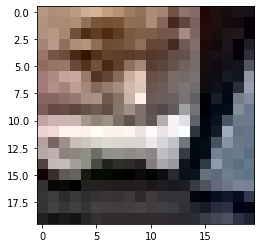

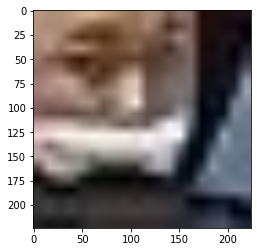

testset/NoMask/38_0Cu3_dfb_2022-02-22-17.38.32_0_yoloface.jpg


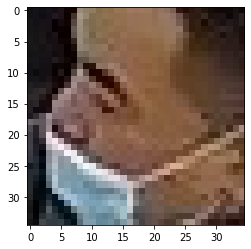

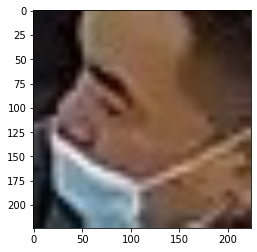

testset/NoMask/frame_2021_12_15_15_56_00_0.jpg


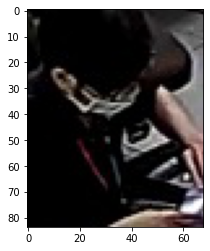

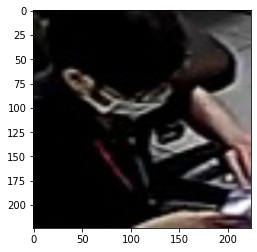

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_5_yoloface.jpg


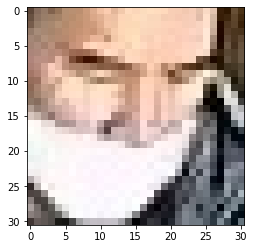

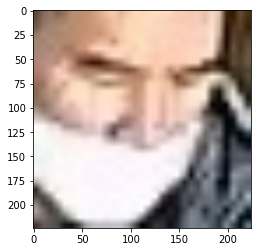

testset/NoMask/38_koiV_fw-1_2022-01-27-10.47.39_0_yoloface.jpg


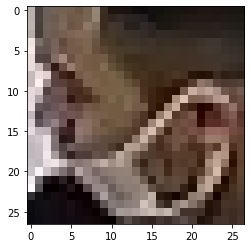

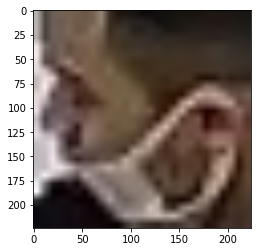

testset/NoMask/frame_2021_12_21_14_50_00_0.jpg


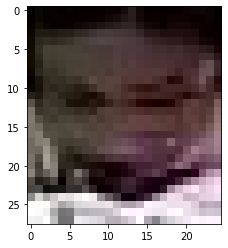

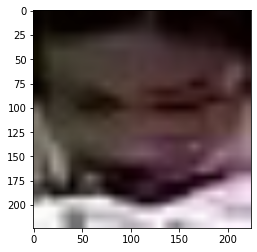

testset/NoMask/38_0Cu3_dfb_2022-02-21-17.38.37_1_yoloface.jpg


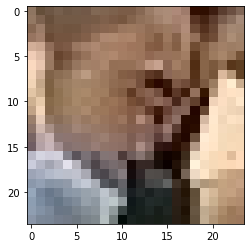

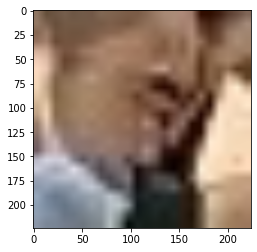

testset/NoMask/38_SK8z_sdc-4_2022-02-11-12.39.49_0_yoloface.jpg


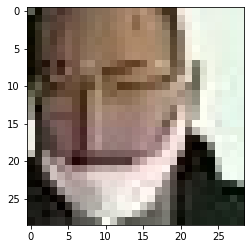

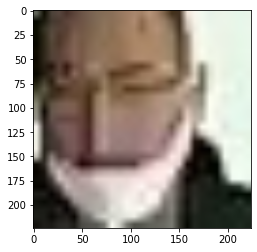

testset/NoMask/38_SK8z_sdc-4_2022-02-15-10.39.32_0_yoloface.jpg


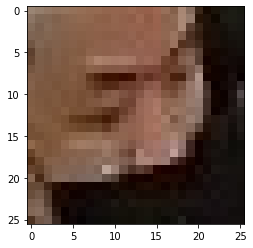

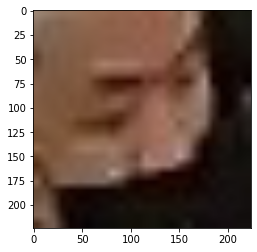

testset/NoMask/38_0Cu3_dfb_2022-02-14-15.45.58_0_yoloface.jpg


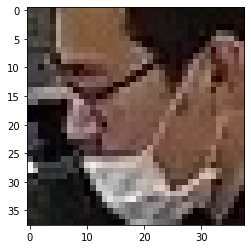

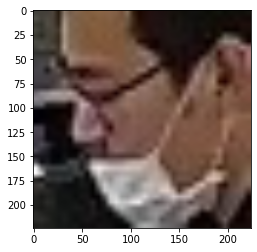

testset/NoMask/38_0Cu3_dfb_2022-02-15-16.45.52_1_yoloface.jpg


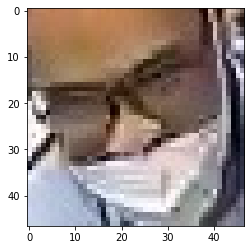

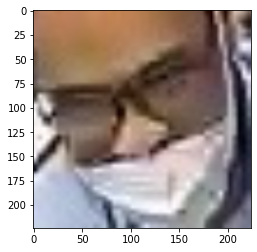

testset/NoMask/38_A99O_gb_2022-02-15-10.40.40_0_yoloface.jpg


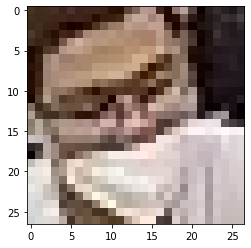

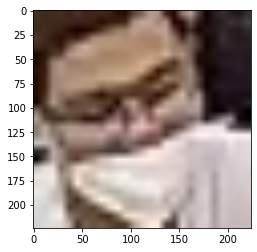

testset/NoMask/38_v175_faf-1_2022-01-28-09.40.48_1_yoloface.jpg


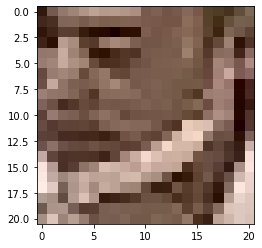

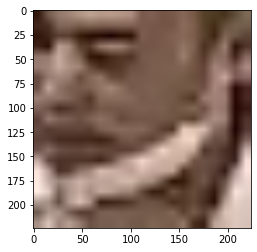

testset/NoMask/38_SK8z_sdc-4_2022-02-11-14.39.49_3_yoloface.jpg


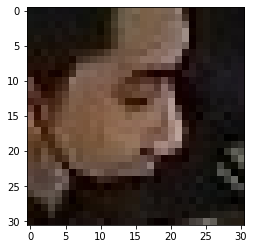

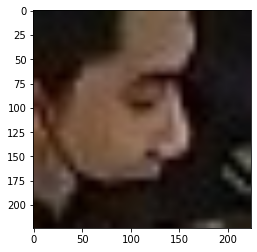

testset/NoMask/38_koiV_fw-1_2022-01-27-09.47.40_1_yoloface.jpg


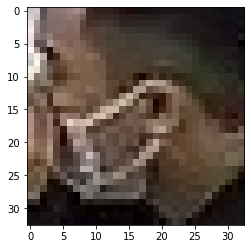

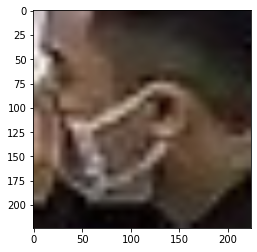

testset/NoMask/38_koiV_fw-1_2022-02-17-09.39.01_3_yoloface.jpg


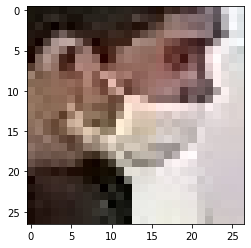

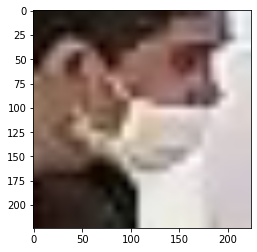

testset/NoMask/38_0Cu3_dfb_2022-02-15-10.45.54_3_yoloface.jpg


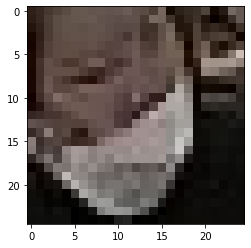

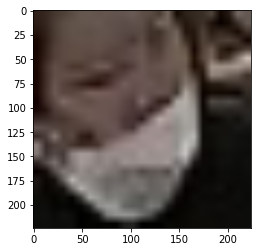

testset/NoMask/frame_2021_12_21_13_40_00_0.jpg


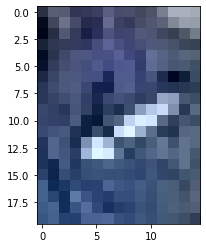

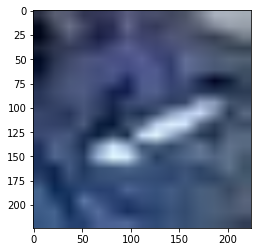

testset/NoMask/38_0Cu3_dfb_2022-02-18-10.38.56_0_yoloface.jpg


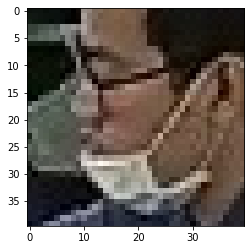

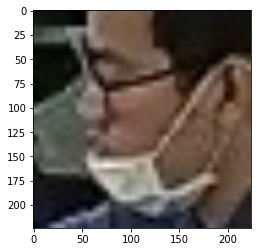

testset/NoMask/38_J7I9_sdc-2_2022-02-17-09.39.02_0_yoloface.jpg


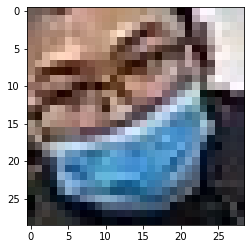

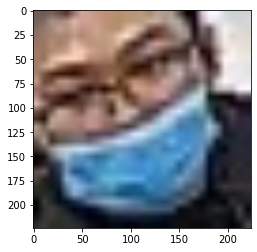

testset/NoMask/38_0Cu3_dfb_2022-02-18-14.38.55_0_yoloface.jpg


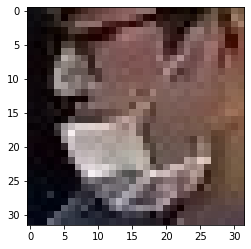

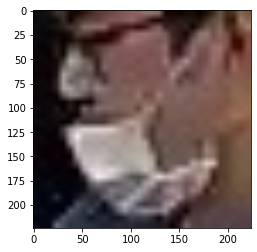

testset/NoMask/frame_2021_12_17_08_43_01_0.jpg


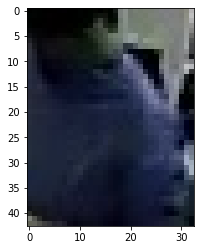

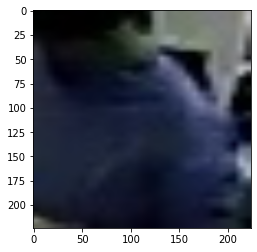

testset/NoMask/38_SK8z_sdc-4_2022-02-14-16.39.34_2_yoloface.jpg


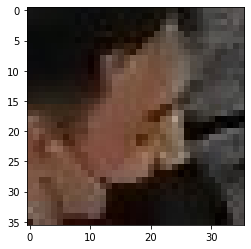

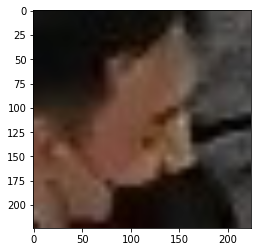

testset/NoMask/38_0Cu3_dfb_2022-02-14-08.46.00_1_yoloface.jpg


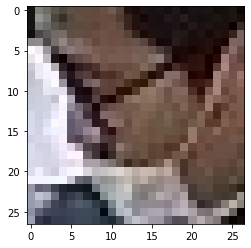

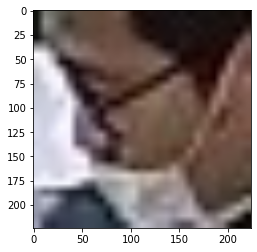

testset/NoMask/38_SK8z_sdc-4_2022-02-17-14.39.19_0_yoloface.jpg


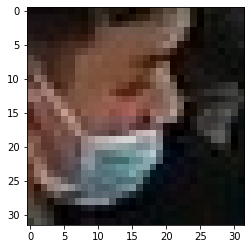

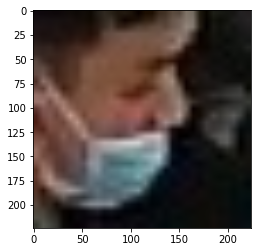

testset/NoMask/38_SK8z_sdc-4_2022-02-16-15.39.26_2_yoloface.jpg


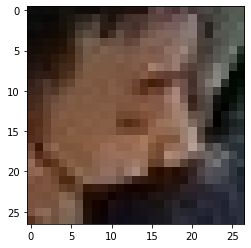

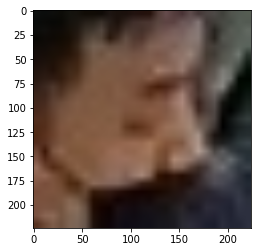

testset/NoMask/38_0Cu3_dfb_2022-02-24-14.38.21_1_yoloface.jpg


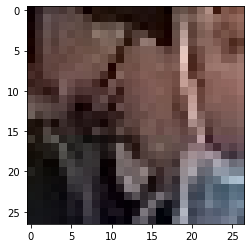

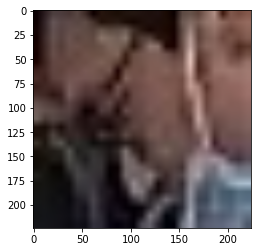

testset/NoMask/38_SK8z_sdc-4_2022-02-15-15.39.31_2_yoloface.jpg


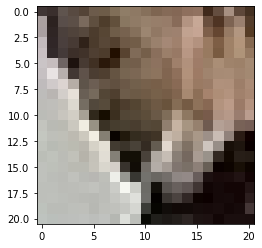

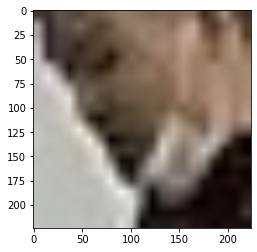

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_4_yoloface.jpg


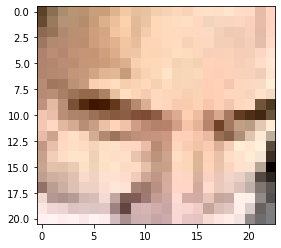

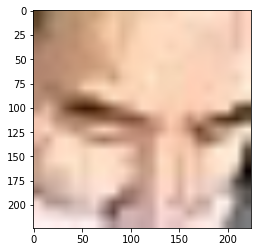

testset/NoMask/38_J7I9_sdc-2_2022-02-15-15.46.06_0_yoloface.jpg


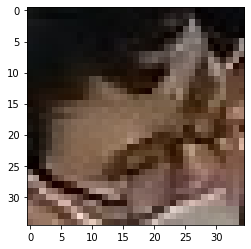

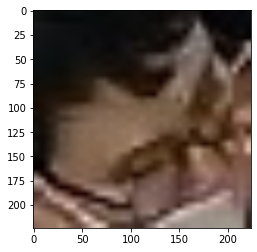

testset/NoMask/38_4WtY_faf_2022-01-27-17.42.46_1_yoloface.jpg


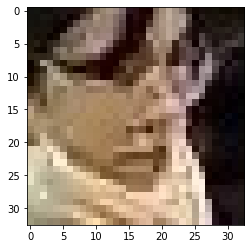

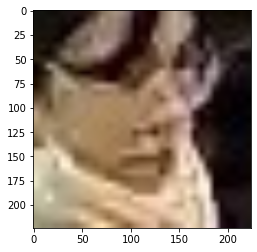

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_1_yoloface.jpg


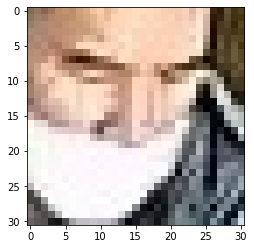

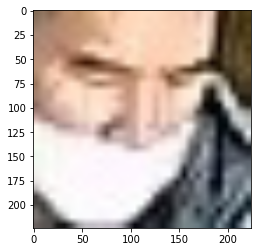

testset/NoMask/38_ybdj_sdc-3_2022-02-15-10.40.45_0_yoloface.jpg


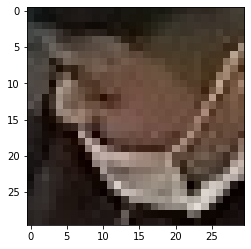

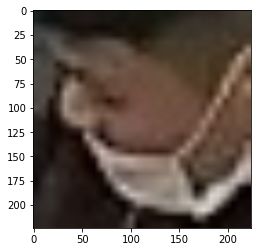

testset/NoMask/38_SK8z_sdc-4_2022-02-18-13.39.15_3_yoloface.jpg


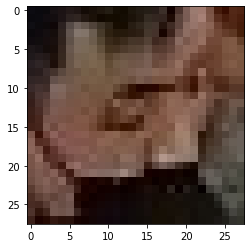

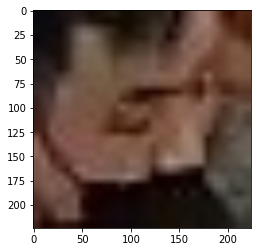

testset/NoMask/38_SK8z_sdc-4_2022-02-10-14.39.54_2_yoloface.jpg


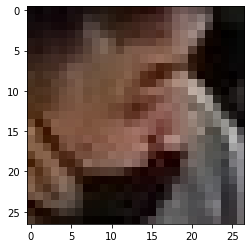

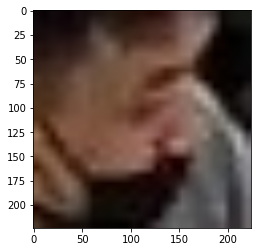

testset/NoMask/38_0Cu3_dfb_2022-02-10-09.46.21_0_yoloface.jpg


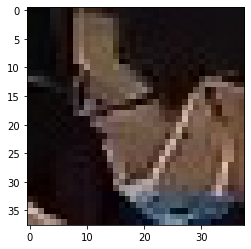

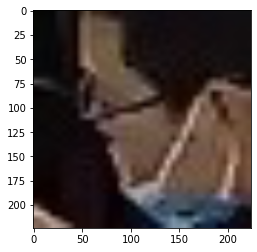

testset/NoMask/38_SK8z_sdc-4_2022-02-16-08.39.26_2_yoloface.jpg


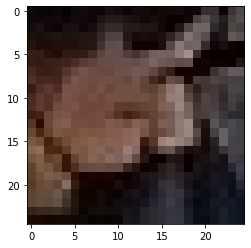

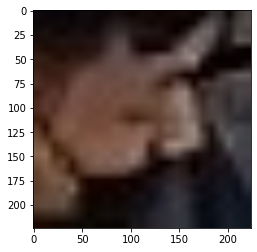

testset/NoMask/38_0Cu3_dfb_2022-02-16-16.39.05_0_yoloface.jpg


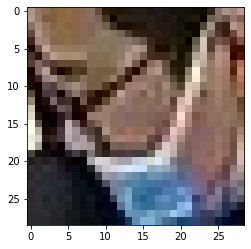

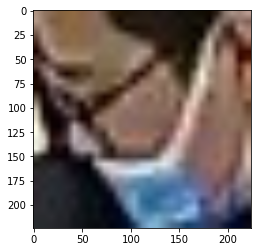

testset/NoMask/frame_2021_12_17_00_31_00_0.jpg


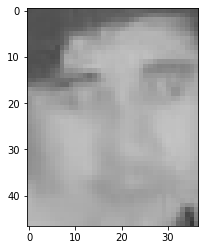

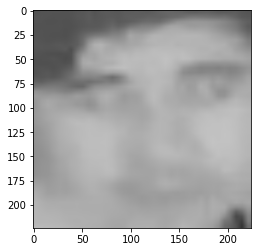

testset/NoMask/38_0Cu3_dfb_2022-02-11-08.46.16_1_yoloface.jpg


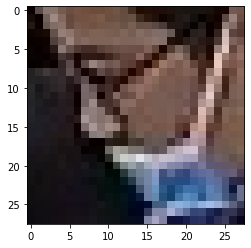

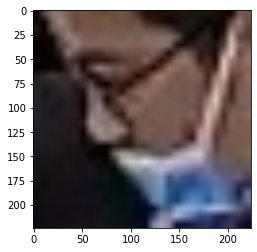

testset/NoMask/frame_2021_12_21_14_40_06_0_1_2.jpg


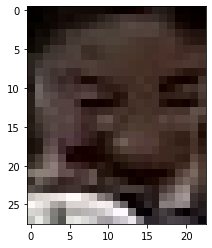

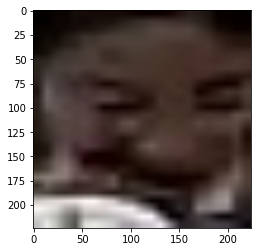

testset/NoMask/38_0Cu3_dfb_2022-02-21-16.38.38_0_yoloface.jpg


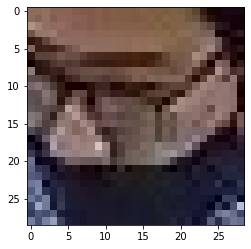

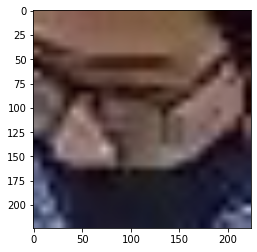

testset/NoMask/38_0Cu3_dfb_2022-02-23-08.38.28_0_yoloface.jpg


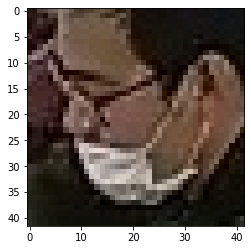

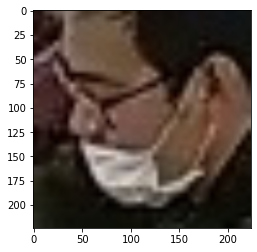

testset/NoMask/38_A99O_gb_2022-02-10-17.41.06_1_yoloface.jpg


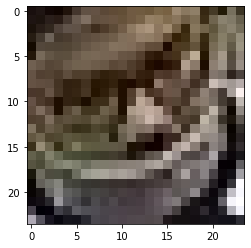

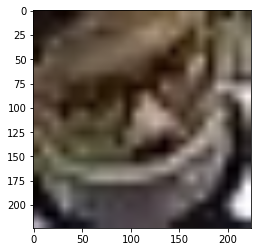

testset/NoMask/38_koiV_fw-1_2022-01-26-16.47.43_0_yoloface.jpg


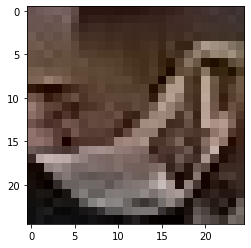

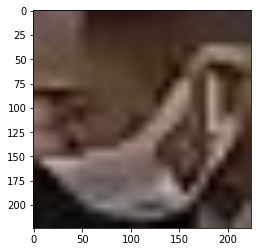

testset/NoMask/38_0Cu3_dfb_2022-02-15-13.45.53_0_yoloface.jpg


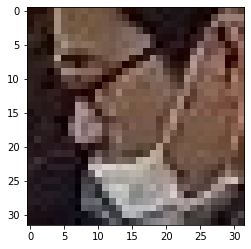

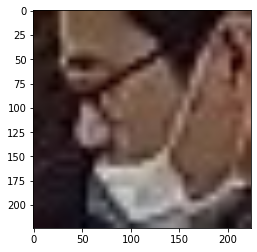

testset/NoMask/38_SK8z_sdc-4_2022-02-16-16.39.25_2_yoloface.jpg


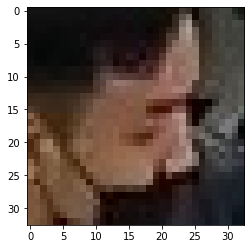

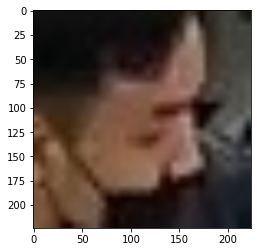

testset/NoMask/38_0Cu3_dfb_2022-02-19-13.38.49_0_yoloface.jpg


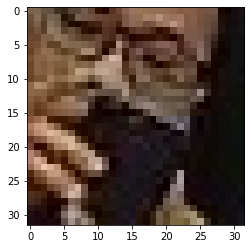

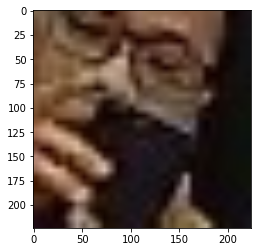

testset/NoMask/38_wRbc_sdc-1_2022-01-26-10.41.07_0_yoloface.jpg


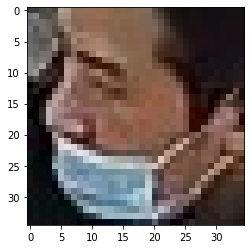

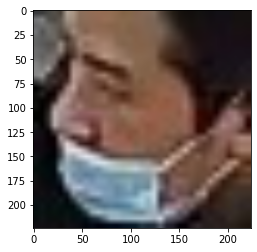

testset/NoMask/38_SK8z_sdc-4_2022-02-16-09.39.28_0_yoloface.jpg


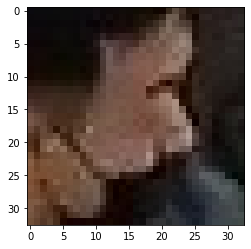

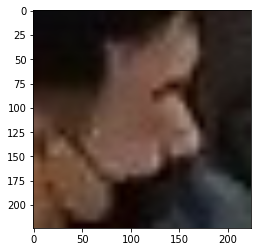

testset/NoMask/38_0Cu3_dfb_2022-02-18-08.38.56_0_yoloface.jpg


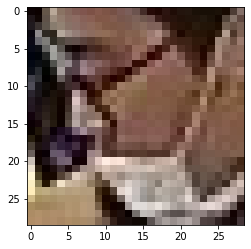

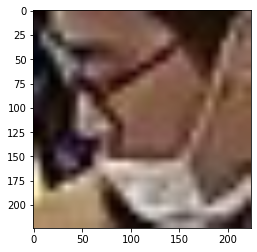

testset/NoMask/38_0Cu3_dfb_2022-02-23-17.38.27_0_yoloface.jpg


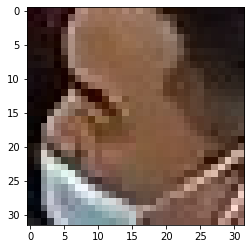

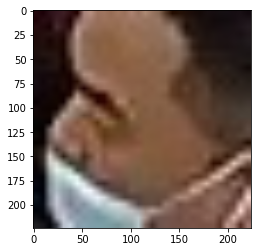

testset/NoMask/38_x9g0_fw_2022-02-16-14.43.48_0_yoloface.jpg


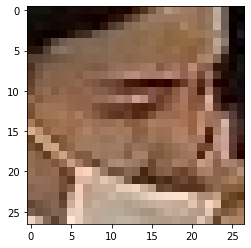

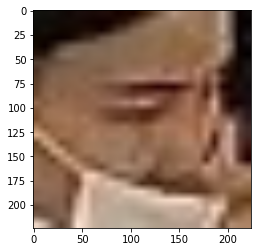

testset/NoMask/38_SK8z_sdc-4_2022-02-08-15.40.02_1_yoloface.jpg


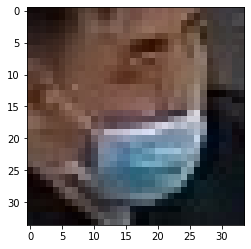

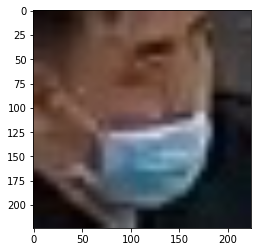

testset/Mask/38_SK8z_sdc-4_2022-02-17-13.39.21_1_yoloface.jpg


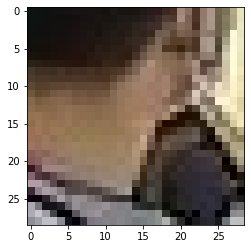

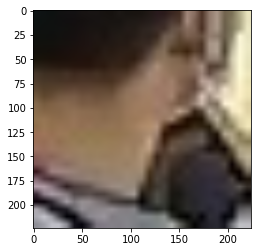

testset/Mask/38_koiV_fw-1_2022-02-11-15.46.18_2_yoloface.jpg


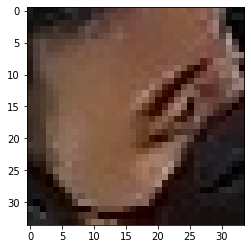

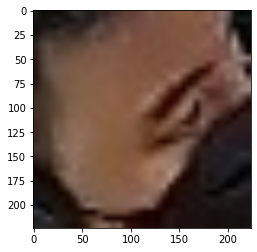

testset/Mask/38_koiV_fw-1_2022-02-21-15.38.38_0_yoloface.jpg


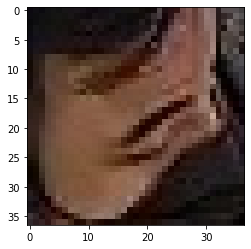

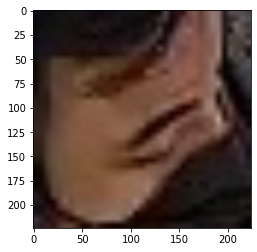

testset/Mask/38_koiV_fw-1_2022-02-18-10.38.56_4_yoloface.jpg


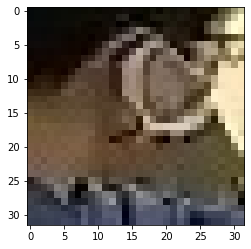

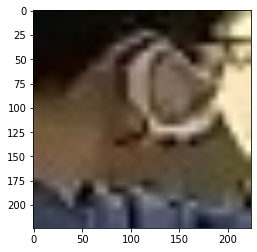

testset/Mask/38_koiV_fw-1_2022-02-16-10.39.06_1_yoloface.jpg


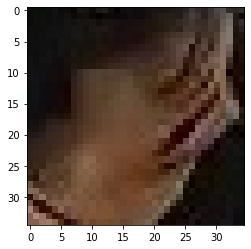

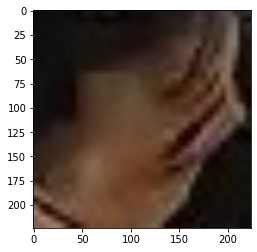

testset/Mask/38_koiV_fw-1_2022-02-16-15.39.06_0_yoloface.jpg


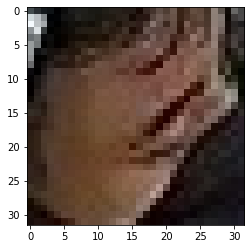

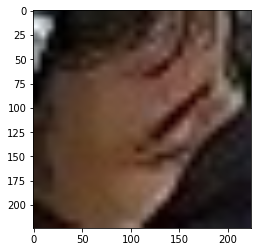

testset/Mask/38_koiV_fw-1_2022-02-15-16.45.57_0_yoloface.jpg


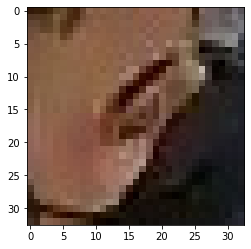

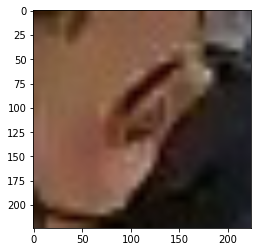

testset/Mask/38_koiV_fw-1_2022-02-17-10.39.01_1_yoloface.jpg


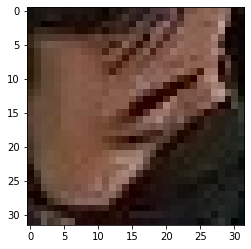

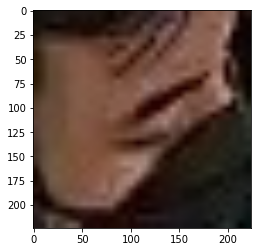

testset/Mask/38_koiV_fw-1_2022-02-16-11.39.06_0_yoloface.jpg


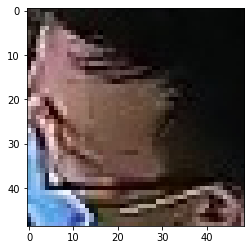

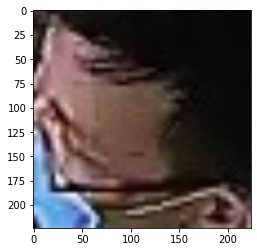

testset/Mask/38_ybdj_sdc-3_2022-01-27-10.42.28_0_yoloface.jpg


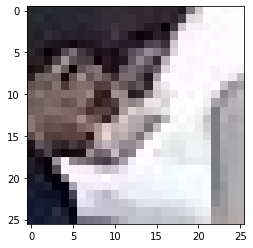

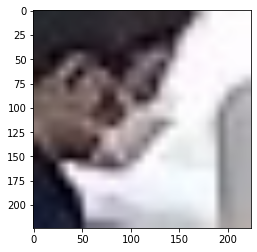

testset/Mask/frame_2021_12_15_09_36_03_0.jpg


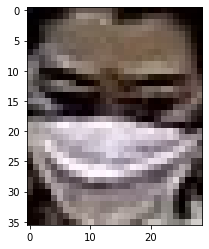

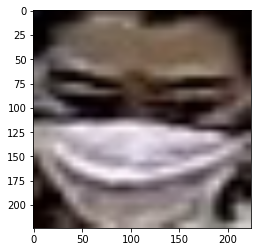

testset/Mask/38_koiV_fw-1_2022-02-16-14.39.06_0_yoloface.jpg


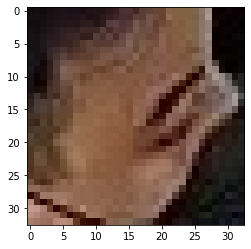

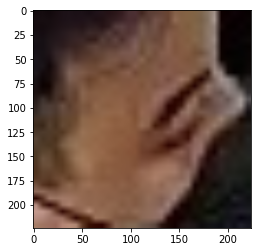

testset/Mask/38_wRbc_sdc-1_2022-02-22-13.39.02_2_yoloface.jpg


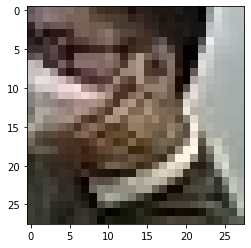

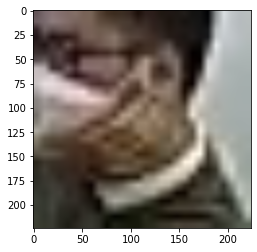

testset/Mask/38_wRbc_sdc-1_2022-02-10-13.39.58_0_yoloface.jpg


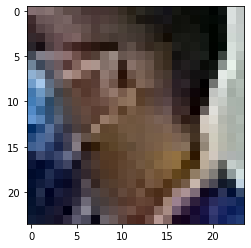

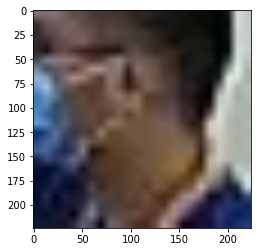

testset/Mask/38_SK8z_sdc-4_2022-02-22-10.38.57_0_yoloface.jpg


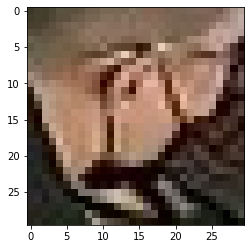

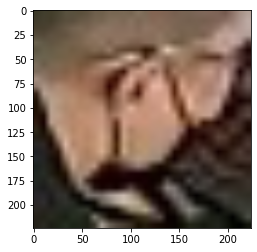

testset/Mask/38_koiV_fw-1_2022-02-17-10.39.01_3_yoloface.jpg


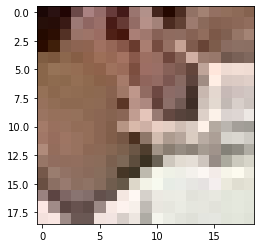

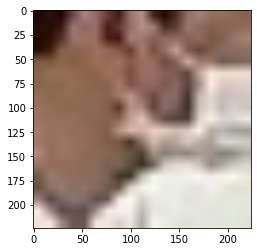

testset/Mask/38_koiV_fw-1_2022-02-17-14.39.00_2_yoloface.jpg


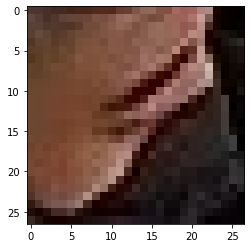

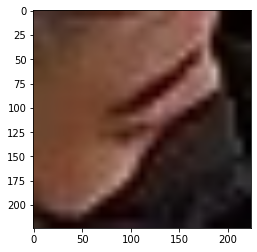

testset/Mask/38_J7I9_sdc-2_2022-02-22-15.38.35_0_yoloface.jpg


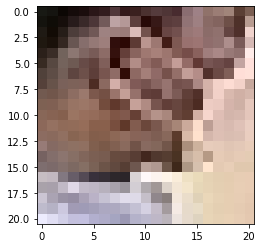

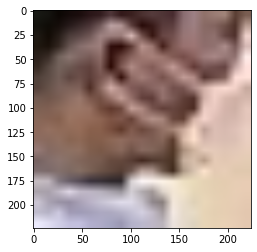

testset/Mask/38_koiV_fw-1_2022-02-21-10.38.39_0_yoloface.jpg


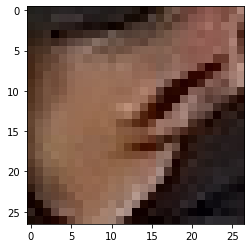

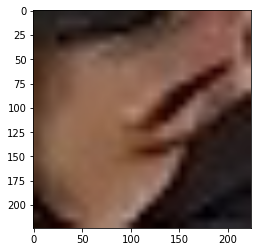

testset/Mask/38_J7I9_sdc-2_2022-02-22-14.38.35_1_yoloface.jpg


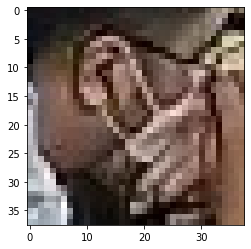

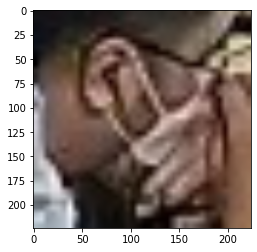

testset/Mask/38_koiV_fw-1_2022-02-11-09.46.20_2_yoloface.jpg


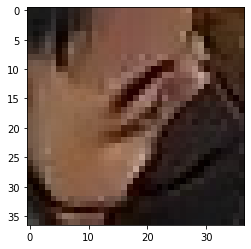

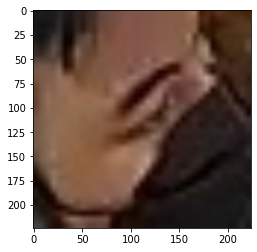

testset/Mask/38_koiV_fw-1_2022-02-11-14.46.18_0_yoloface.jpg


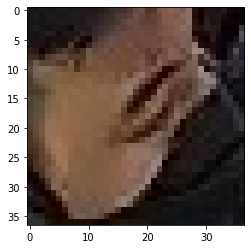

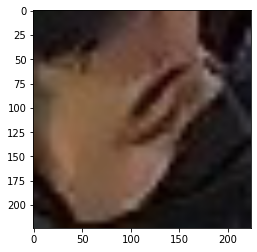

testset/Mask/frame_2021_12_13_10_30_05_0_1.jpg


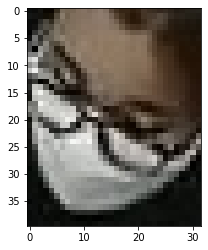

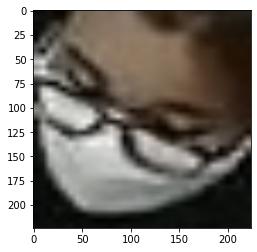

testset/Mask/38_ybdj_sdc-3_2022-02-18-13.40.27_1_yoloface.jpg


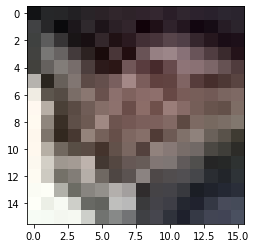

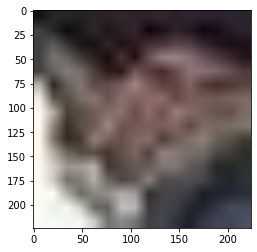

testset/Mask/38_x9g0_fw_2022-02-23-15.43.16_0_yoloface.jpg


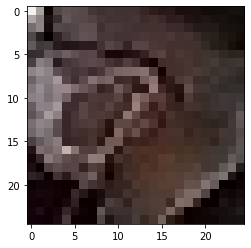

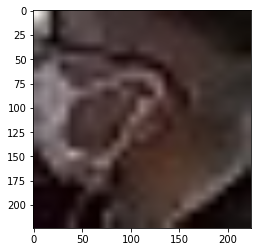

testset/Mask/38_v175_faf-1_2022-02-15-10.39.14_2_yoloface.jpg


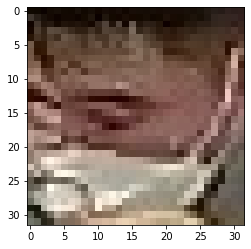

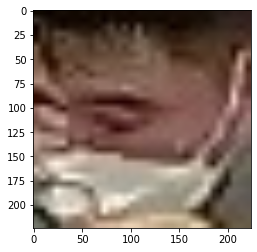

testset/Mask/38_koiV_fw-1_2022-02-10-16.46.23_1_yoloface.jpg


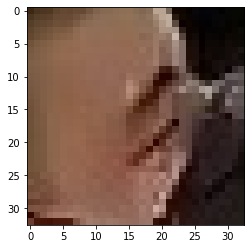

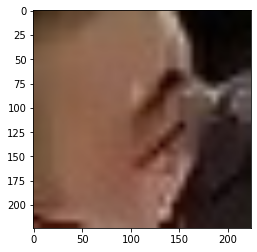

testset/Mask/38_koiV_fw-1_2022-02-09-14.46.29_1_yoloface.jpg


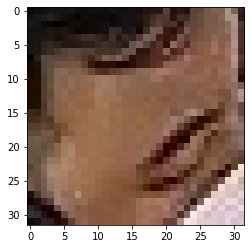

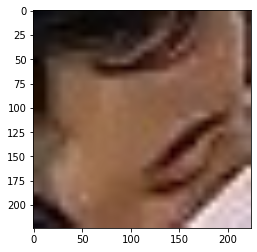

testset/Mask/38_koiV_fw-1_2022-02-16-13.39.06_0_yoloface.jpg


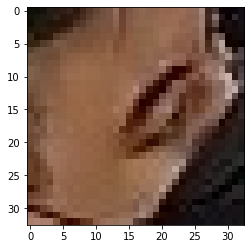

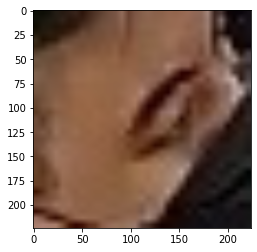

testset/Mask/38_v175_faf-1_2022-02-11-15.39.34_0_yoloface.jpg


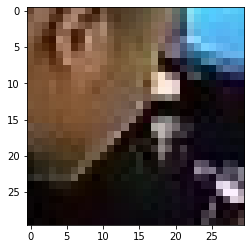

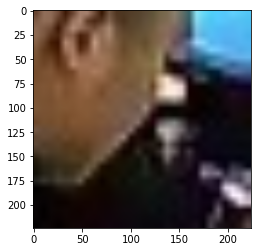

testset/Mask/38_v175_faf-1_2022-02-07-09.39.55_1_yoloface.jpg


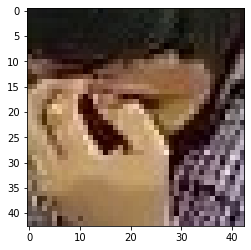

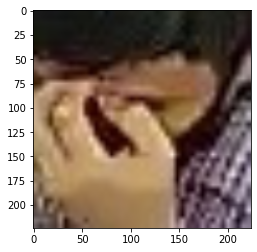

testset/Mask/38_v175_faf-1_2022-02-08-16.39.48_3_yoloface.jpg


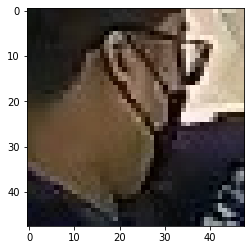

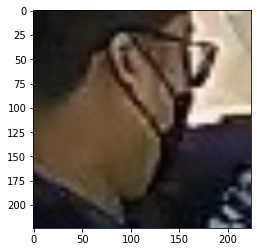

testset/Mask/38_ybdj_sdc-3_2022-02-18-15.40.27_2_yoloface.jpg


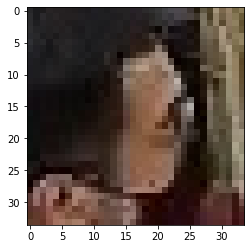

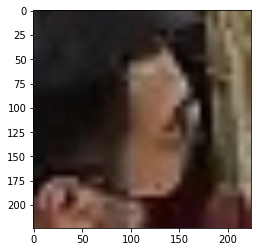

testset/Mask/38_koiV_fw-1_2022-02-16-09.39.06_0_yoloface.jpg


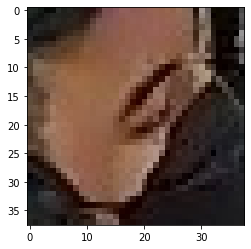

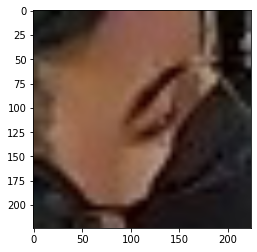

testset/Mask/38_0Cu3_dfb_2022-02-09-09.46.27_1_yoloface.jpg


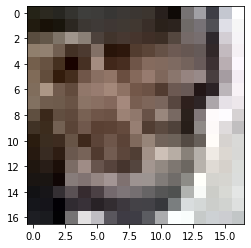

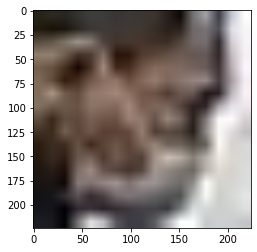

testset/Mask/38_koiV_fw-1_2022-02-16-16.39.05_1_yoloface.jpg


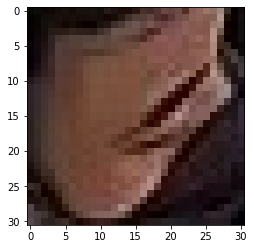

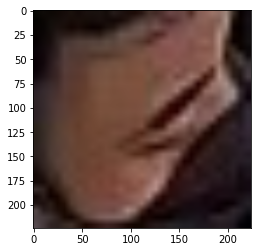

testset/Mask/38_wRbc_sdc-1_2022-01-26-09.41.07_0_yoloface.jpg


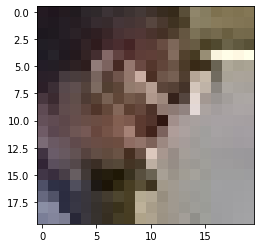

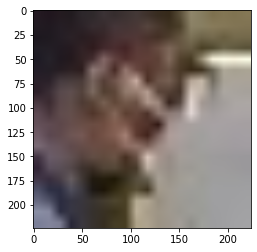

testset/Mask/38_koiV_fw-1_2022-02-21-08.38.40_0_yoloface.jpg


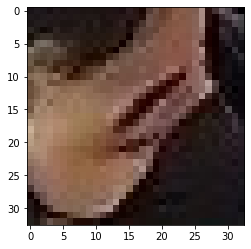

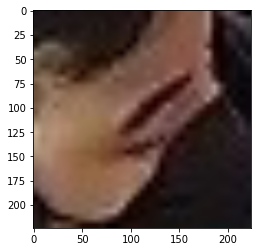

testset/Mask/frame_2021_12_15_14_56_07_0.jpg


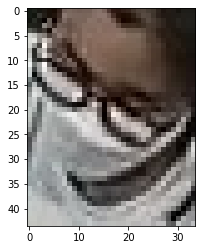

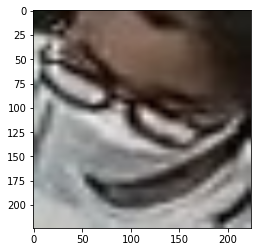

testset/Mask/38_J7I9_sdc-2_2022-02-24-09.38.26_1_yoloface.jpg


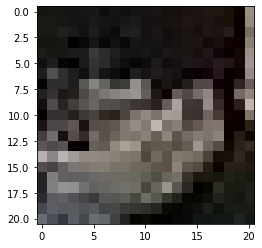

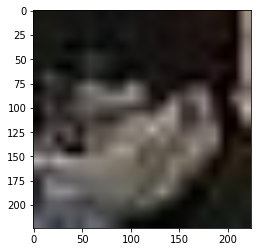

testset/Mask/38_koiV_fw-1_2022-02-17-13.39.01_0_yoloface.jpg


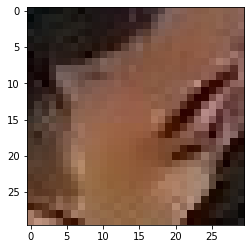

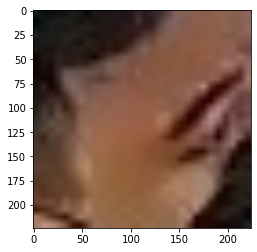

testset/Mask/38_ybdj_sdc-3_2022-02-22-15.40.06_1_yoloface.jpg


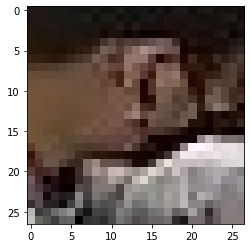

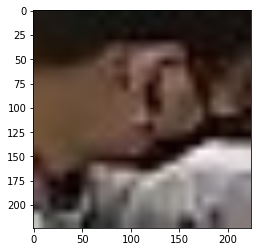

testset/Mask/38_SK8z_sdc-4_2022-02-10-15.39.52_1_yoloface.jpg


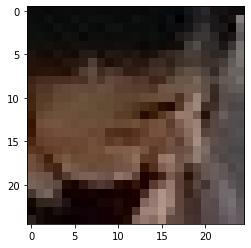

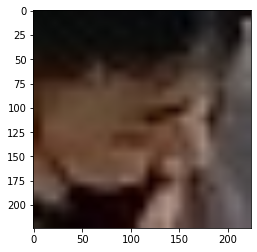

testset/Mask/38_v175_faf-1_2022-02-09-13.39.45_1_yoloface.jpg


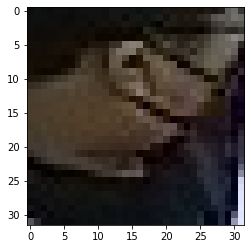

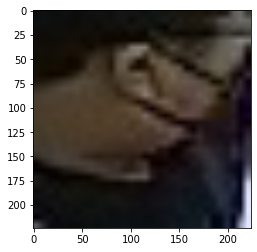

testset/Mask/38_koiV_fw-1_2022-02-21-14.38.39_0_yoloface.jpg


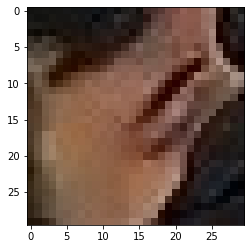

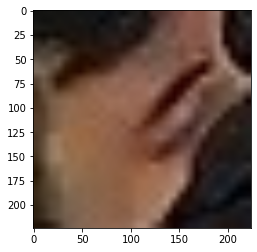

testset/Mask/38_v175_faf-1_2022-01-26-13.40.57_0_yoloface.jpg


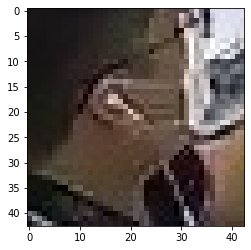

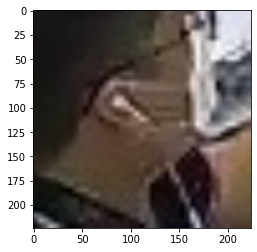

testset/Mask/38_v175_faf-1_2022-02-11-08.39.36_2_yoloface.jpg


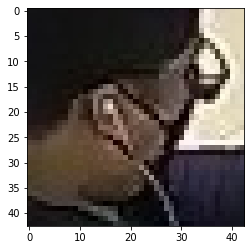

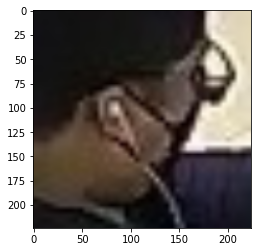

testset/Mask/38_koiV_fw-1_2022-02-15-13.45.57_1_yoloface.jpg


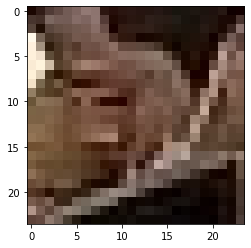

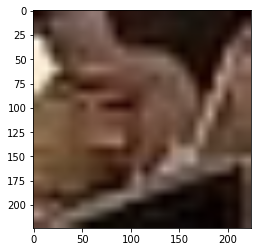

In [66]:
def process(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = mpimg.imread(filename)
    plt.imshow(image)
    plt.show()
    # <something gets done here>
    image = np.array(image)
    image = cv2.resize(image,(224,224))
    plt.imshow(image)
    plt.show()
    
with open("incorrect_label/resnet_50_incorrect_label.txt") as files:
    for file in files:
        print(file.rstrip('\n'))
        process(file.rstrip('\n'))

## 3.2 Resnet-34

In [67]:
!python detect_mask_image.py --model output_model/mask_detector_resnet_34 --image testset

2022-03-09 05:55:22.738464: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
[INFO] loading face detector model...
[INFO] loading face mask detector model...
2022-03-09 05:55:24.731929: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-03-09 05:55:25.590752: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:8c:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2022-03-09 05:55:25.590791: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-03-09 05:55:25.592089: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-03-09 05:55:25.593336: I tensorflow/stream_executor

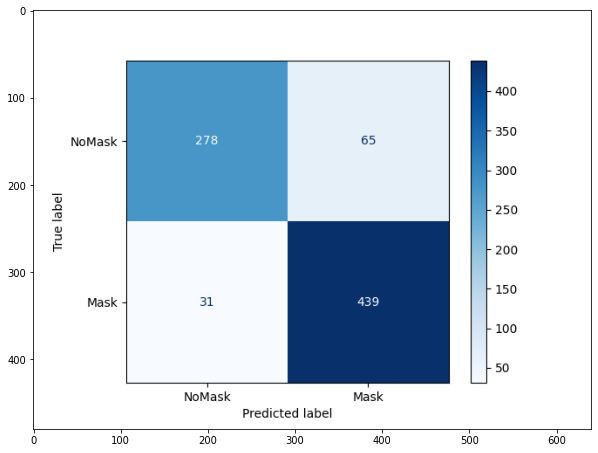

In [68]:
img = mpimg.imread('output_confusionMatrix_png/resnet_34.png')
plt.figure(figsize=(10,10)) 
imgplot = plt.imshow(img)
plt.show()

In [69]:
import time

testset/NoMask/38_v175_faf-1_2022-01-27-17.40.50_3_yoloface.jpg


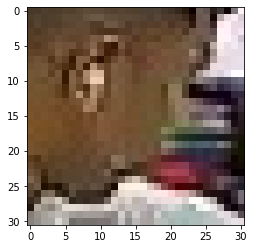

testset/NoMask/38_SK8z_sdc-4_2022-02-08-11.40.03_0_yoloface.jpg


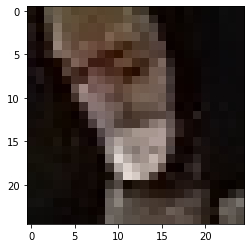

testset/NoMask/38_0Cu3_dfb_2022-02-21-15.38.38_2_yoloface.jpg


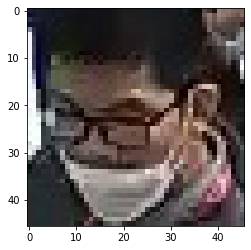

testset/NoMask/38_ybdj_sdc-3_2022-02-15-08.40.45_2_yoloface.jpg


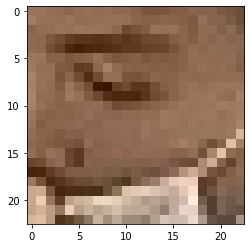

testset/NoMask/38_0Cu3_dfb_2022-02-11-16.46.14_4_yoloface.jpg


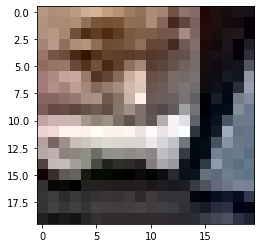

testset/NoMask/38_ybdj_sdc-3_2022-02-17-18.40.32_1_yoloface.jpg


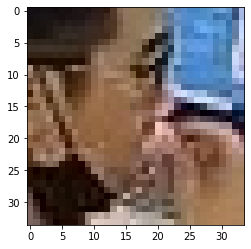

testset/NoMask/38_0Cu3_dfb_2022-02-22-17.38.32_0_yoloface.jpg


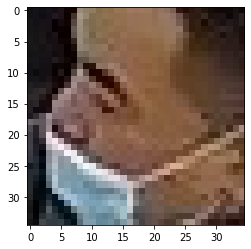

testset/NoMask/frame_2021_12_15_15_56_00_0.jpg


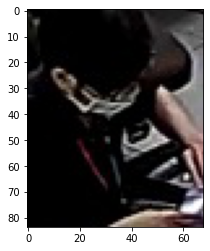

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_5_yoloface.jpg


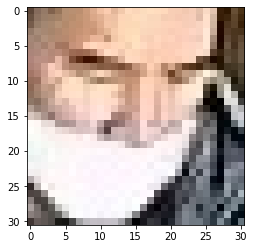

testset/NoMask/38_koiV_fw-1_2022-01-27-10.47.39_0_yoloface.jpg


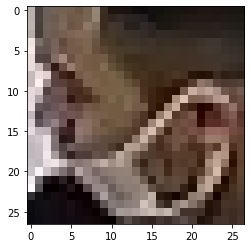

testset/NoMask/frame_2021_12_21_14_50_00_0.jpg


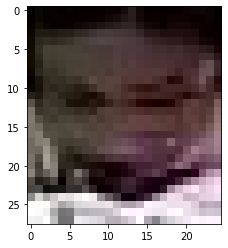

testset/NoMask/38_0Cu3_dfb_2022-02-21-17.38.37_1_yoloface.jpg


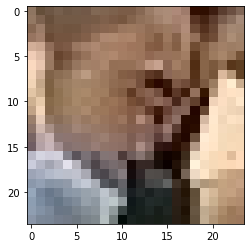

testset/NoMask/38_SK8z_sdc-4_2022-02-11-12.39.49_0_yoloface.jpg


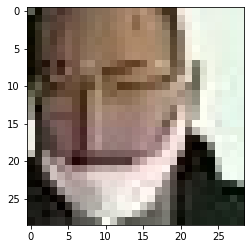

testset/NoMask/38_ybdj_sdc-3_2022-02-18-12.40.28_0_yoloface.jpg


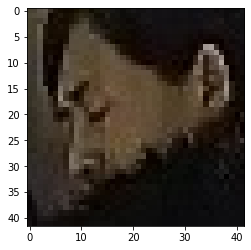

testset/NoMask/38_SK8z_sdc-4_2022-02-15-10.39.32_0_yoloface.jpg


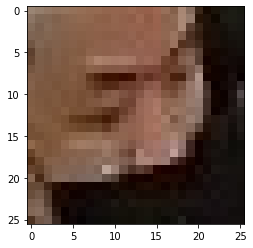

testset/NoMask/38_0Cu3_dfb_2022-02-14-15.45.58_0_yoloface.jpg


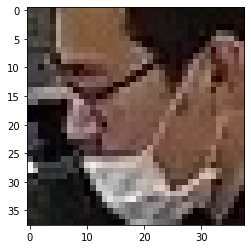

testset/NoMask/38_SK8z_sdc-4_2022-02-11-14.39.49_3_yoloface.jpg


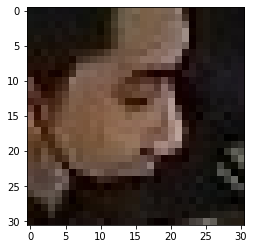

testset/NoMask/38_v175_faf-1_2022-02-15-16.39.13_2_yoloface.jpg


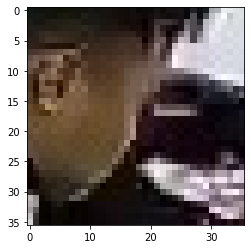

testset/NoMask/38_koiV_fw-1_2022-01-27-09.47.40_1_yoloface.jpg


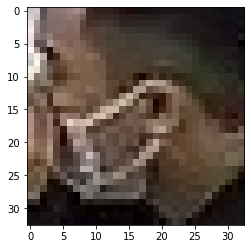

testset/NoMask/38_koiV_fw-1_2022-02-17-09.39.01_3_yoloface.jpg


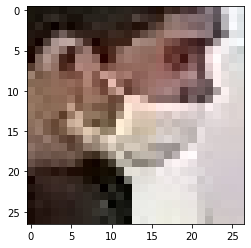

testset/NoMask/38_0Cu3_dfb_2022-02-15-10.45.54_3_yoloface.jpg


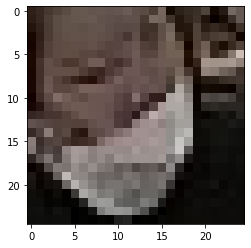

testset/NoMask/38_0Cu3_dfb_2022-02-15-14.45.53_0_yoloface.jpg


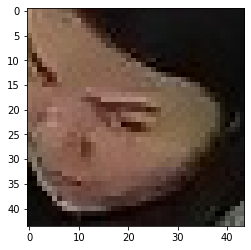

testset/NoMask/38_0Cu3_dfb_2022-02-22-16.38.32_1_yoloface.jpg


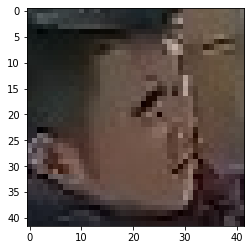

testset/NoMask/38_0Cu3_dfb_2022-02-18-10.38.56_0_yoloface.jpg


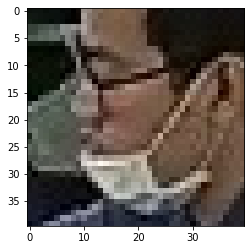

testset/NoMask/38_J7I9_sdc-2_2022-02-17-09.39.02_0_yoloface.jpg


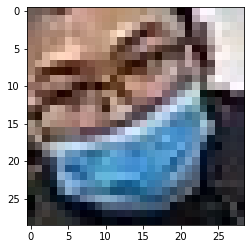

testset/NoMask/frame_2021_12_15_11_56_01_0.jpg


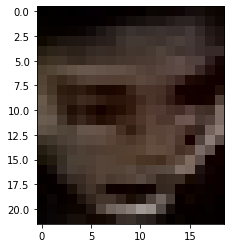

testset/NoMask/frame_2021_12_17_08_43_01_0.jpg


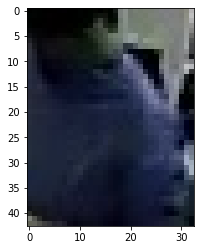

testset/NoMask/38_SK8z_sdc-4_2022-02-14-16.39.34_2_yoloface.jpg


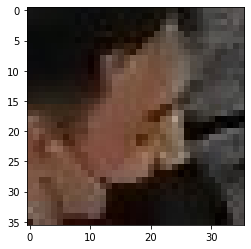

testset/NoMask/38_0Cu3_dfb_2022-02-14-08.46.00_1_yoloface.jpg


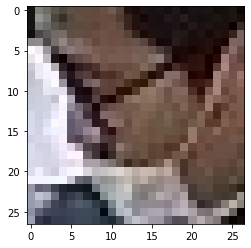

testset/NoMask/38_SK8z_sdc-4_2022-02-17-14.39.19_0_yoloface.jpg


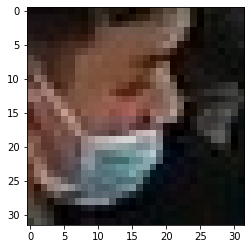

testset/NoMask/frame_2021_12_21_17_30_07_0.jpg


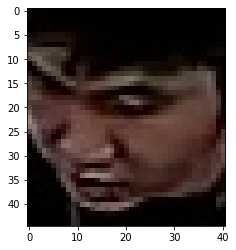

testset/NoMask/38_SK8z_sdc-4_2022-02-16-15.39.26_2_yoloface.jpg


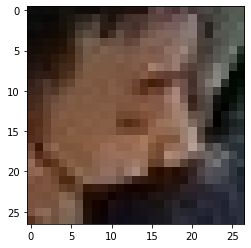

testset/NoMask/38_0Cu3_dfb_2022-02-24-14.38.21_1_yoloface.jpg


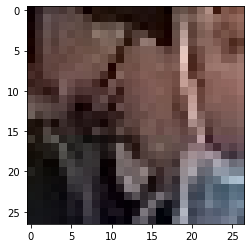

testset/NoMask/frame_2021_12_16_11_10_03_0_1.jpg


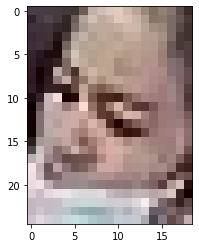

testset/NoMask/38_SK8z_sdc-4_2022-02-15-15.39.31_2_yoloface.jpg


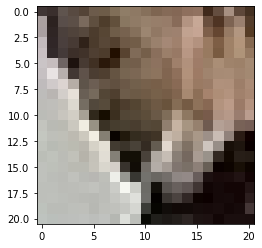

testset/NoMask/frame_2021_12_13_15_13_07_0.jpg


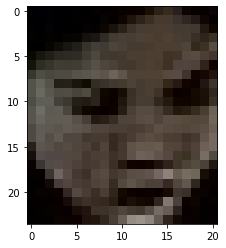

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_4_yoloface.jpg


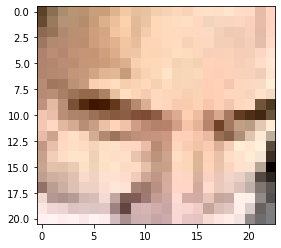

testset/NoMask/38_J7I9_sdc-2_2022-02-15-15.46.06_0_yoloface.jpg


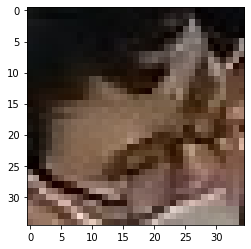

testset/NoMask/frame_2021_12_17_10_03_02_0.jpg


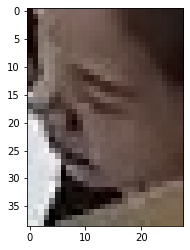

testset/NoMask/frame_2021_12_21_16_20_00_0.jpg


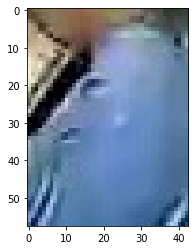

testset/NoMask/38_SK8z_sdc-4_2022-02-18-11.39.15_1_yoloface.jpg


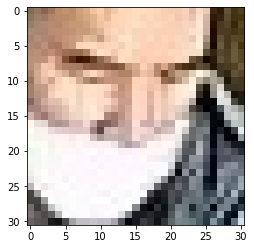

testset/NoMask/38_ybdj_sdc-3_2022-02-15-10.40.45_0_yoloface.jpg


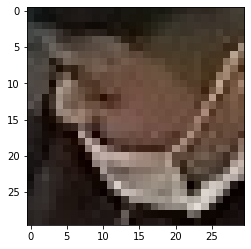

testset/NoMask/38_ybdj_sdc-3_2022-02-15-10.40.45_1_yoloface.jpg


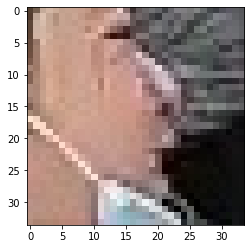

testset/NoMask/38_SK8z_sdc-4_2022-02-18-13.39.15_3_yoloface.jpg


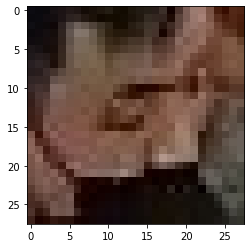

testset/NoMask/38_x9g0_fw_2022-02-14-12.43.57_0_yoloface.jpg


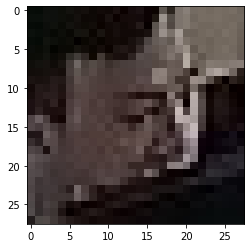

testset/NoMask/38_SK8z_sdc-4_2022-02-10-14.39.54_2_yoloface.jpg


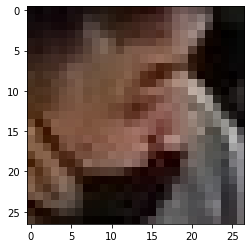

testset/NoMask/38_0Cu3_dfb_2022-02-10-09.46.21_0_yoloface.jpg


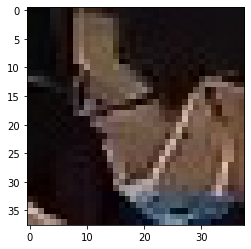

testset/NoMask/38_SK8z_sdc-4_2022-02-16-08.39.26_2_yoloface.jpg


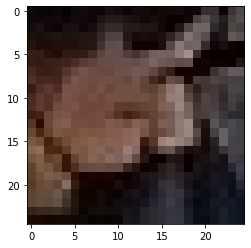

testset/NoMask/38_0Cu3_dfb_2022-02-16-16.39.05_0_yoloface.jpg


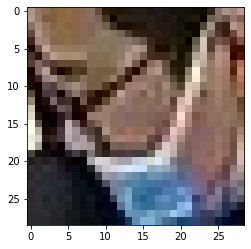

testset/NoMask/38_ybdj_sdc-3_2022-02-16-16.40.38_3_yoloface.jpg


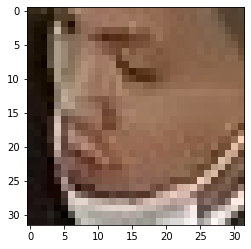

testset/NoMask/frame_2021_12_17_00_31_00_0.jpg


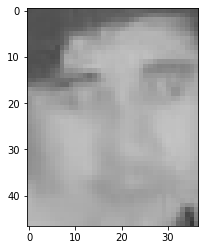

testset/NoMask/frame_2021_12_21_14_40_06_0_1_2.jpg


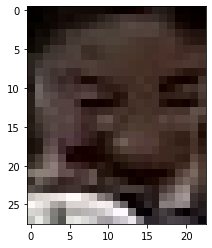

testset/NoMask/38_0Cu3_dfb_2022-02-21-16.38.38_0_yoloface.jpg


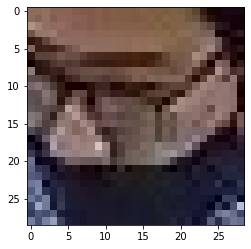

testset/NoMask/38_0Cu3_dfb_2022-02-23-08.38.28_0_yoloface.jpg


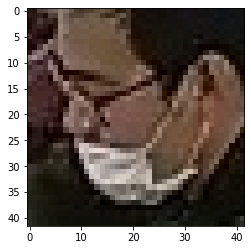

testset/NoMask/38_koiV_fw-1_2022-01-26-16.47.43_0_yoloface.jpg


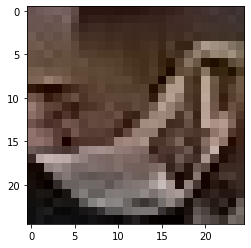

testset/NoMask/38_0Cu3_dfb_2022-02-15-13.45.53_0_yoloface.jpg


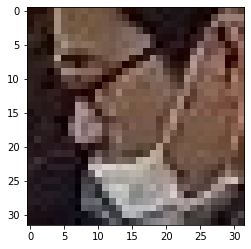

testset/NoMask/38_SK8z_sdc-4_2022-02-16-16.39.25_2_yoloface.jpg


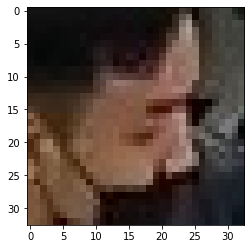

testset/NoMask/frame_2021_12_13_11_50_05_0.jpg


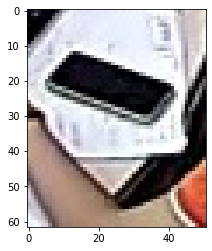

testset/NoMask/frame_2021_12_21_14_40_06_0_1.jpg


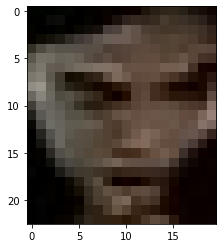

testset/NoMask/38_SK8z_sdc-4_2022-02-16-14.39.25_0_yoloface.jpg


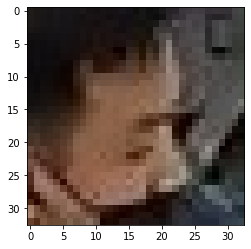

testset/NoMask/38_SK8z_sdc-4_2022-02-16-09.39.28_0_yoloface.jpg


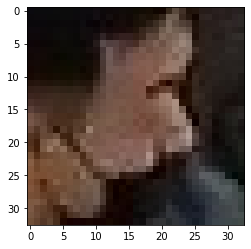

testset/NoMask/38_0Cu3_dfb_2022-02-23-17.38.27_0_yoloface.jpg


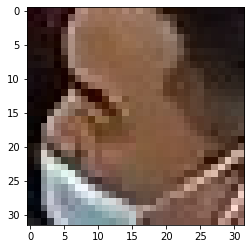

testset/NoMask/38_x9g0_fw_2022-02-16-14.43.48_0_yoloface.jpg


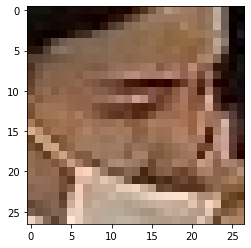

testset/NoMask/38_SK8z_sdc-4_2022-02-08-15.40.02_1_yoloface.jpg


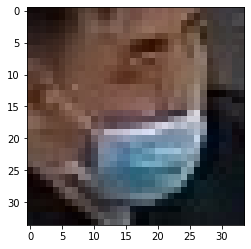

testset/NoMask/38_koiV_fw-1_2022-01-27-11.47.39_0_yoloface.jpg


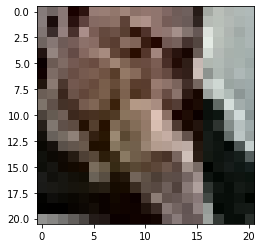

testset/Mask/38_koiV_fw-1_2022-02-11-13.46.18_1_yoloface.jpg


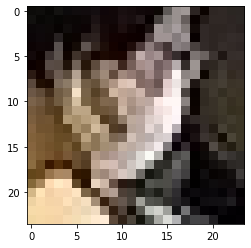

testset/Mask/38_koiV_fw-1_2022-02-16-10.39.06_1_yoloface.jpg


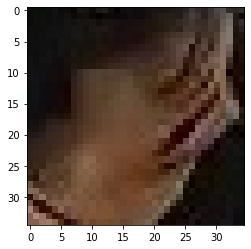

testset/Mask/38_koiV_fw-1_2022-02-16-15.39.06_0_yoloface.jpg


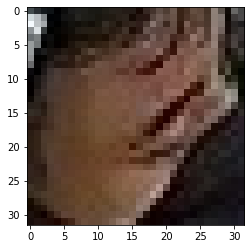

testset/Mask/frame_2021_12_21_12_40_07_0_1.jpg


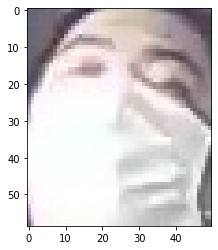

testset/Mask/38_SK8z_sdc-4_2022-02-11-11.39.50_0_yoloface.jpg


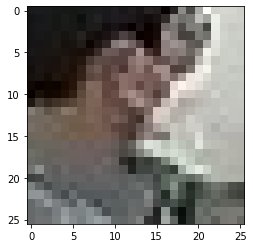

testset/Mask/frame_2021_12_16_13_31_05_0.jpg


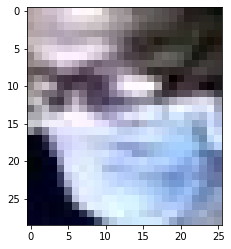

testset/Mask/38_ybdj_sdc-3_2022-01-27-10.42.28_0_yoloface.jpg


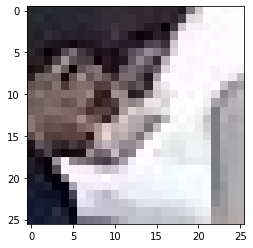

testset/Mask/38_koiV_fw-1_2022-02-16-14.39.06_0_yoloface.jpg


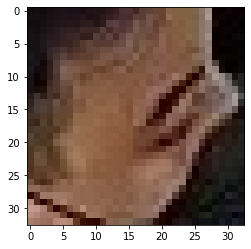

testset/Mask/38_SK8z_sdc-4_2022-02-18-08.39.16_1_yoloface.jpg


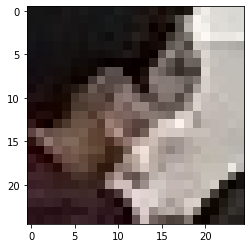

testset/Mask/38_wRbc_sdc-1_2022-02-10-13.39.58_0_yoloface.jpg


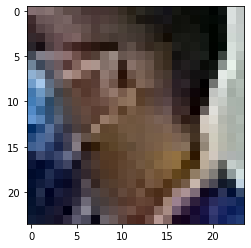

testset/Mask/38_v175_faf-1_2022-01-27-16.40.50_1_yoloface.jpg


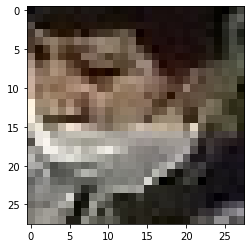

testset/Mask/38_v175_faf-1_2022-01-27-08.40.52_2_yoloface.jpg


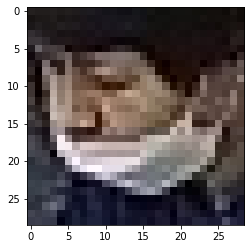

testset/Mask/38_koiV_fw-1_2022-02-21-10.38.39_0_yoloface.jpg


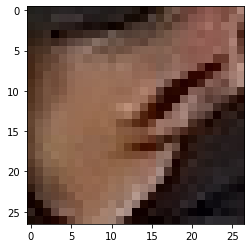

testset/Mask/38_x9g0_fw_2022-02-23-15.43.16_0_yoloface.jpg


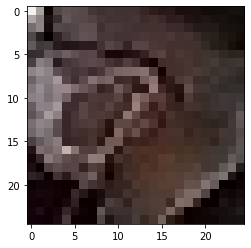

testset/Mask/38_v175_faf-1_2022-02-15-10.39.14_2_yoloface.jpg


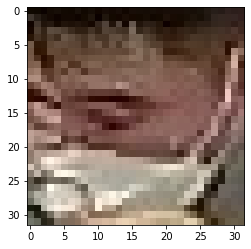

testset/Mask/38_koiV_fw-1_2022-02-10-16.46.23_1_yoloface.jpg


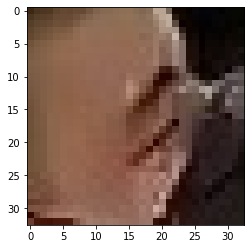

testset/Mask/38_koiV_fw-1_2022-02-09-14.46.29_1_yoloface.jpg


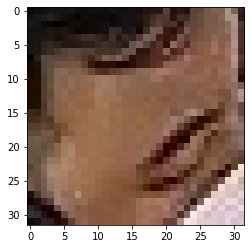

testset/Mask/38_koiV_fw-1_2022-02-16-13.39.06_0_yoloface.jpg


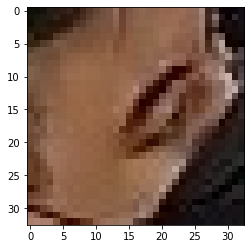

testset/Mask/38_v175_faf-1_2022-02-11-15.39.34_0_yoloface.jpg


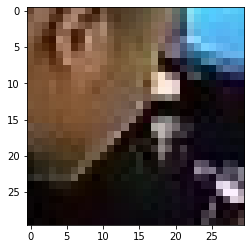

testset/Mask/38_v175_faf-1_2022-02-07-09.39.55_1_yoloface.jpg


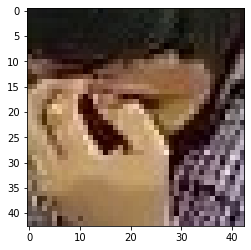

testset/Mask/38_4WtY_faf_2022-01-26-09.42.50_0_yoloface.jpg


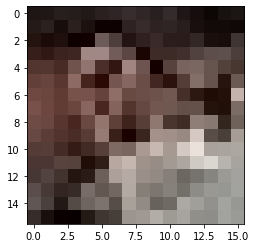

testset/Mask/38_ybdj_sdc-3_2022-02-11-09.41.05_2_yoloface.jpg


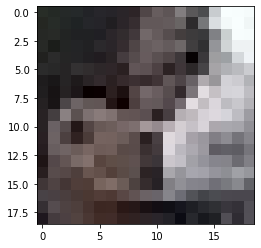

testset/Mask/38_J7I9_sdc-2_2022-02-24-09.38.26_1_yoloface.jpg


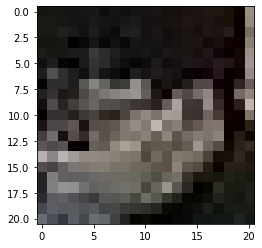

testset/Mask/38_koiV_fw-1_2022-02-17-13.39.01_0_yoloface.jpg


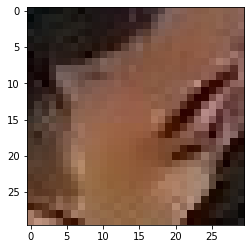

testset/Mask/38_koiV_fw-1_2022-02-21-14.38.39_0_yoloface.jpg


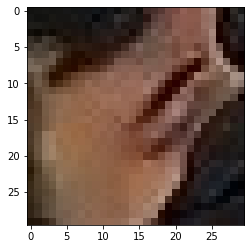

testset/Mask/38_v175_faf-1_2022-01-26-13.40.57_0_yoloface.jpg


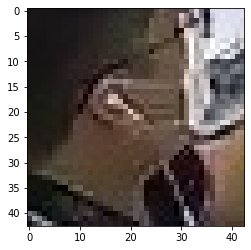

testset/Mask/38_v175_faf-1_2022-01-26-14.40.56_3_yoloface.jpg


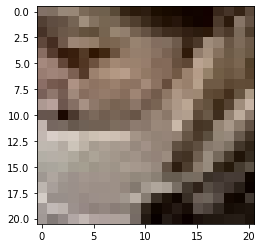

testset/Mask/38_v175_faf-1_2022-01-26-13.40.57_3_yoloface.jpg


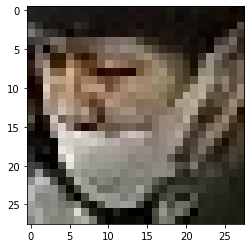

testset/Mask/38_v175_faf-1_2022-01-27-09.40.52_0_yoloface.jpg


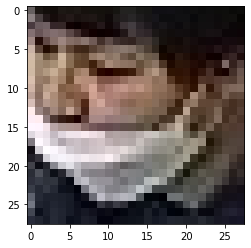

testset/Mask/38_koiV_fw-1_2022-02-18-15.38.55_1_yoloface.jpg


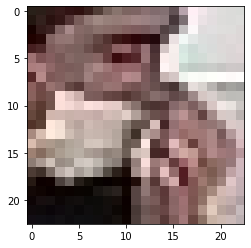

testset/Mask/frame_2021_12_15_09_16_04_0.jpg


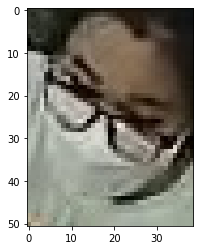

In [70]:
def process(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = mpimg.imread(filename)
    # <something gets done here>
    plt.figure()
    plt.imshow(image)
    
with open("incorrect_label/resnet_34_incorrect_label.txt") as files:
    for file in files:
        print(file.rstrip('\n'))
        process(file.rstrip('\n'))
        plt.show()

## 3.2 Mobilenet_v2

In [71]:
!python detect_mask_image.py --model output_model/mask_detector_mobilenet_v2 --image testset

2022-03-09 05:56:05.411149: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
[INFO] loading face detector model...
[INFO] loading face mask detector model...
2022-03-09 05:56:07.431998: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2022-03-09 05:56:08.319850: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:8c:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2022-03-09 05:56:08.319888: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2022-03-09 05:56:08.321155: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2022-03-09 05:56:08.322357: I tensorflow/stream_executor

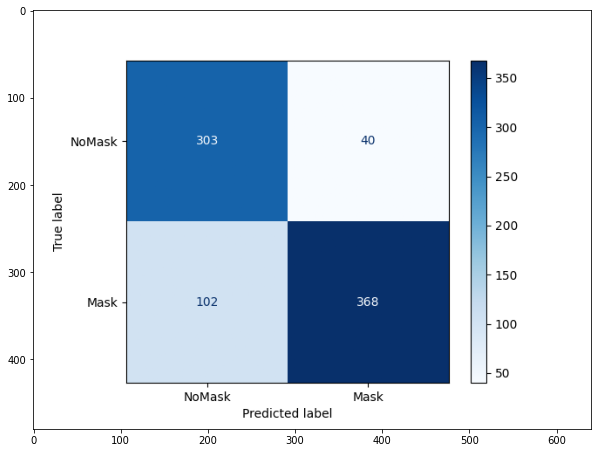

In [72]:
img = mpimg.imread('output_confusionMatrix_png/mobilenet_v2.png')
plt.figure(figsize=(10,10)) 
imgplot = plt.imshow(img)
plt.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


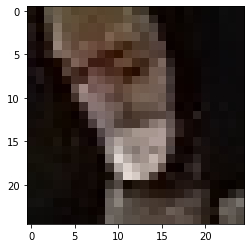

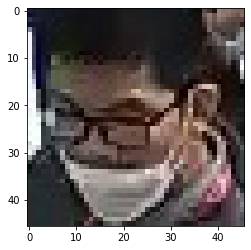

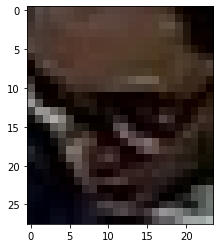

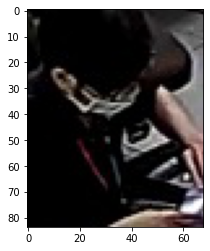

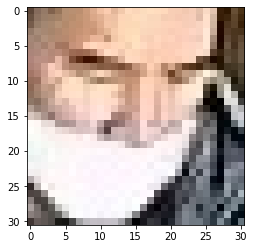

...

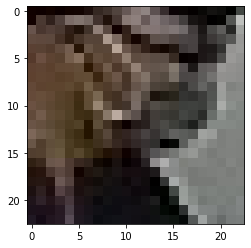

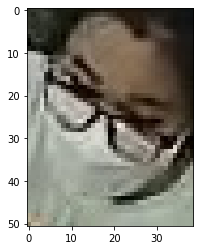

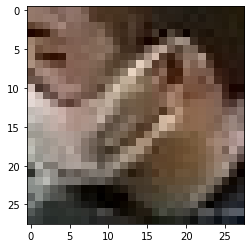

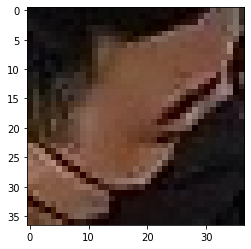

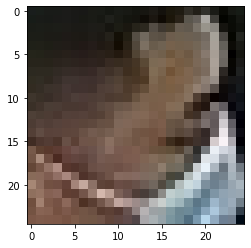

In [73]:
def process(filename: str=None) -> None:
    """
    View multiple images stored in files, stacking vertically

    Arguments:
        filename: str - path to filename containing image
    """
    image = mpimg.imread(filename)
    # <something gets done here>
    plt.figure()
    plt.imshow(image)
    
with open("incorrect_label/mobilenet_v2_incorrect_label.txt") as files:
    for file in files:
        process(file.rstrip('\n'))